# Test notebook for Piecewise Linear Utility Androids

In [1]:
using Pkg
Pkg.activate("../")

  Activating project at `c:\Users\gggzy\Desktop\Z\mkt\ExchangeMarket.jl\scripts`


In [2]:
using Revise
using Random, SparseArrays, LinearAlgebra
using JuMP, MosekTools
using Plots, LaTeXStrings, Printf
import MathOptInterface as MOI

using ExchangeMarket

include("../tools.jl")
include("../plots.jl")
switch_to_pdf(; bool_use_html=true)

include("./util.jl")
include("./master.jl")
include("./pricing.jl")


┌ Warning: `PlotlyKaleido` 2.3.0 is not compatible with this version of `Plots`. The declared compatibility is 1.
└ @ Plots C:\Users\gggzy\.julia\packages\Plots\FFuQi\src\backends.jl:55


Cardinal Optimizer v7.1.4. Build date Jun 27 2024
Copyright Cardinal Operations 2024. All Rights Reserved


update_pwl_optimizer_from_market!

## Setup Piecewise Linear Market

In [3]:
m = 3  # number of ground truth agents
n = 10  # number of goods
K = 20  # number of revealed preference observations
scale = 1.0
# -----------------------------------------------------------------------
# Create ground truth market with piecewise linear agents
# -----------------------------------------------------------------------
L_max = 4  # maximum number of segments per good
A_gt = zeros(Float64, n, L_max, m)
b_gt = zeros(Float64, L_max, m)

Random.seed!(2)
for i in 1:m
    base_pref = ones(n) .+ 0.5 * rand(n) 
    base_pref ./= sum(base_pref) 
    
    for l in 1:L_max
        noise = (rand(n) .- 0.5) * 0.1 
        a_vec = max.(1e-4, base_pref .+ noise)
        layer_scale = scale * (0.8 + rand()) 
        A_gt[:, l, i] = a_vec * layer_scale
        b_gt[l, i] = 0.0 
    end
end
# Create FisherMarket with piecewise linear utilities
f0 = FisherMarket(m, n; A_planes=A_gt, b_planes=b_gt, scale=scale)
linconstr = LinearConstr(1, n, ones(1, n), [1.0])  # 1/n x_1 <= 1

# -----------------------------------------------------------------------
# Setup algorithm for computing demands
# -----------------------------------------------------------------------
f1 = copy(f0)
p₀ = ones(n) ./ n
x₀ = ones(n, m) ./ m
f1.x .= x₀
f1.p .= p₀
pwl_optimizer = PiecewiseLPResponse()

# Use MirrorDescent for piecewise linear 
alg = MirrorDec(
    n, m, p₀;
    optimizer=pwl_optimizer,
    option_grad=:dual,
    option_step=:eg,
    option_stepsize=:cc13,
    tol=1e-6,
    maxiter=1000
)

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.1660 seconds
FisherMarket initialized in 0.2740 seconds
FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0010 seconds
FisherMarket initialized in 0.0010 seconds


MirrorDec{Float64}(10, 3, [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.786400165183776, 0.8925975682484205, 0.45201517659689416, 0.2068733032049488, 0.6721739949391414, 0.630176047635695, 0.24998573762663634, 0.6379494743238538, 0.04440825613482957, 0.4058890219614756], -1.0e6, [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 0.0, 0.0, [10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0], 0.0, 1.770783415333e9, 0.0, 0.0, 0.0, 0, 0, 1000, 100.0, 1.0e-6, :MirrorDec, ExchangeMarket.ResponseOptimizer(ExchangeMarket.var"#__piecewise_response#108"{ExchangeMarket.var"#__piecewise_response#105#109"}(ExchangeMarket.var"#__piecewise_response#105#109"()), :linprog, "GeneralPiecewiseLPResponse"), :dual, :eg, :cc13, NullSampler(#undef, 2407593189328))

## Compute Real Market Equilibrium

In [4]:
alg_real = Conic(n, m; tol=1e-10)
p_real = create_primal_pwl(alg_real, f1)
validate(f1, alg_real)

Problem
  Name                   :                 
  Objective sense        : maximize        
  Type                   : CONIC (conic optimization problem)
  Constraints            : 22              
  Affine conic cons.     : 3 (9 rows)
  Disjunctive cons.      : 0               
  Cones                  : 0               
  Scalar variables       : 36              
  Matrix variables       : 0               
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.02            
Lin. dep.  - primal attempts        : 1                 successes              : 1               
Lin. dep.  - dual attempts          : 0                 

In [6]:
x_real = f1.x
@show(p_real)

p_real = [0.10718049341994144, 0.13015593824479668, 0.05332762014894369, 0.077254180249103, 0.16561613301369532, 0.07780059122564295, 0.1244887158946726, 0.0944093920552611, 0.08840419684241407, 0.08136459534543775]


10-element Vector{Float64}:
 0.10718049341994144
 0.13015593824479668
 0.05332762014894369
 0.077254180249103
 0.16561613301369532
 0.07780059122564295
 0.1244887158946726
 0.0944093920552611
 0.08840419684241407
 0.08136459534543775

In [7]:
sum(p_real) 

1.0000018564399087

## Generate Revealed Preferences

In [8]:
using Statistics: mean
include("./master.jl")
include("./pricing.jl")
Ξ = produce_revealed_preferences(alg, f1, K; seed=42);
perm = shuffle(1:K)
K_train = Int(round(0.8 * K))
train_idx = perm[1:K_train]
test_idx  = perm[K_train+1:end]

Ξ_train = Ξ[train_idx]
Ξ_test  = Ξ[test_idx]
sparsity_count = 0
for k in 1:min(10, K)
    p_k, g_k = Ξ[k]
    num_nonzero = sum(g_k .> 1e-6)
    println("Observe $k: $(num_nonzero) non-zero goods, aggregate demand = $(sum(g_k))")
    if num_nonzero <= 2
        sparsity_count += 1
    end
end

for i in 1:m
    println("\nAgent $i:")
    for k in 1:min(5, K)
        p_k, _ = Ξ[k]
        alg_test = MirrorDec(n, 1, copy(p_k); optimizer=pwl_optimizer, linconstr=linconstr)
        temp_market = FisherMarket(1, n; A_planes=f1.A_planes[:, :, i:i], 
                                   b_planes=f1.b_planes[:, i:i], w=[1.0])
        play!(alg_test, temp_market)
        x_i = temp_market.x[:, 1]
        num_nonzero = sum(x_i .> 1e-6)
        println("  Price $k: $(num_nonzero) non-zero goods")
    end
end

for i in 1:m
    diffs = []
    for l1 in 1:L_max
        for l2 in (l1+1):L_max
            diff = norm(A_gt[:, l1, i] - A_gt[:, l2, i])
            push!(diffs, diff)
        end
    end
    println("Agent $i: average segment difference = $(mean(diffs))")
end

Computing demand for observation 1 at prices: [0.06712779654090693, 0.08673837419857172, 0.0783854508486898, 0.06618281351094174, 0.11393250590798745, 0.10810670523914472, 0.09587600391262513, 0.15044865550529463, 0.13975130600358215, 0.09345038833225555]
Computing demand for observation 2 at prices: [0.0631127855918965, 0.09512666932135919, 0.1893884563288241, 0.050329934926855675, 0.15827857041487253, 0.09885903628706368, 0.10074186897540965, 0.08627713556098958, 0.09982645451589879, 0.05805908807683045]
Computing demand for observation 3 at prices: [0.12627762461564074, 0.08170623683264273, 0.11674698833770944, 0.07152184212464718, 0.04279456415619958, 0.1570731445702084, 0.05516702194181713, 0.13539069941094237, 0.0697265042449877, 0.14359537376520456]
Computing demand for observation 4 at prices: [0.08237963375514741, 0.12022582534388461, 0.11561714928107493, 0.12782251754944593, 0.12016882844798792, 0.141248098455155, 0.10074554599418517, 0.04627790645995315, 0.09562326080309651,

## Column Generation for CES Agents

In [ ]:
# Column generation: iteratively add new CES androids to fit revealed preferences
# -----------------------------------------------------------------------
# Parameters
# -----------------------------------------------------------------------
max_iters = 100
tol = 1e-6  # tolerance for reduced cost

# -----------------------------------------------------------------------
# Initialize surrogate market with one random CES agent
# -----------------------------------------------------------------------
fa = FisherMarket(1, n; ρ=0.9, scale=30.0, sparsity=0.99)
γ_ref = Ref(compute_gamma_from_market(fa, Ξ_train))

# Track history
history = Dict(
    :primal_obj => Float64[],
    :dual_obj => Float64[],
    :reduced_cost => Float64[],
    :num_agents => Int[]
)

println("=== Column Generation for CES Android Fitting ===\n")

for iter in 1:max_iters
    println("--- Iteration $iter ($(fa.m) agents) ---")

    # Solve master problem (primal and dual)  ## TODO: 求一个primal/dual
    w, s, model_primal = solve_master_problem(Ξ_train, γ_ref[]; verbose=false)
    u, μ, model_dual = solve_dual_problem(Ξ_train, γ_ref[]; verbose=false)

    primal_obj = objective_value(model_primal)
    dual_obj = objective_value(model_dual)

    push!(history[:primal_obj], primal_obj)
    push!(history[:dual_obj], dual_obj)
    push!(history[:num_agents], fa.m)

    println("  Primal obj: $(round(primal_obj, digits=6))")
    println("  Dual obj:   $(round(dual_obj, digits=6))")
    println("  Weights w:  $(round.(w, digits=4))")

    # Solve pricing subproblem to find best new android
    y_opt, σ_opt, γ_new, pricing_obj = solve_pricing(Ξ_train, u)

    # Compute reduced cost
    rc = reduced_cost(γ_new, u, μ)
    push!(history[:reduced_cost], rc)

    println("  Pricing σ:  $(round(σ_opt, digits=4))")
    println("  Reduced cost: $(round(rc, digits=6))")

    # Check termination: if reduced cost <= 0, no improving android exists
    if rc <= tol
        println("\n✓ Converged! No improving android found (reduced cost ≤ $tol)")
        break
    end

    # Update existing agents' budgets with optimal weights from master
    fa.w .= w

    # Add new android to γ matrix (in-place via Ref)
    add_to_gamma!(γ_ref, γ_new)

    # Recover CES parameters and add to surrogate market
    c_new, ρ_new = recover_ces_params(y_opt, σ_opt)
    w_new = 0.0  # placeholder, will be updated in next iteration
    add_to_market!(fa, c_new, ρ_new, w_new)

    println("  → Added android $(fa.m) with ρ=$(round(ρ_new, digits=4))")
    println()

    if iter == max_iters
        println("\n⚠ Maximum iterations reached")
    end
end

# Final solve to get optimal weights for all agents
w_final, _, _ = solve_master_problem(Ξ_train, γ_ref[]; verbose=false)
fa.w .= w_final

println("\n=== Final Results ===")
println("Number of fitted agents: $(fa.m)")
println("Number of nonzero agents: $(sum(w_final .> 1e-6))")
println("Ground truth agents:     $(f1.m)")
println("Final primal objective:  $(round(history[:primal_obj][end], digits=6))")
println("Final weights: $(round.(w_final, digits=4))")

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0230 seconds
FisherMarket initialized in 0.0230 seconds
=== Column Generation for CES Android Fitting ===

--- Iteration 1 (1 agents) ---
  Primal obj: 6.709616
  Dual obj:   6.709616
  Weights w:  [1.0]
  Pricing σ:  30.0
  Reduced cost: 13.626492
  → Added android 2 with ρ=0.9677

--- Iteration 2 (2 agents) ---
  Primal obj: 3.77542
  Dual obj:   3.77542
  Weights w:  [0.6047, 0.3953]
  Pricing σ:  30.0
  Reduced cost: 10.283509
  → Added android 3 with ρ=0.9677

--- Iteration 3 (3 agents) ---
  Primal obj: 2.842505
  Dual obj:   2.842505
  Weights w:  [0.4599, 0.3051, 0.235]
  Pricing σ:  30.0
  Reduced cost: 7.306103
  → Added android 4 with ρ=0.9677

--- Iteration 4 (4 agents) ---
  Primal obj: 2.07656
  Dual obj:   2.07656
  Weights w:  [0.3067, 0.3133, 0.15, 0.2299]
  Pricing σ:  30.0
  Reduced cost: 8.147771
  → Added android 5 with ρ=0.9677

--- Iteration 5 (5 agents) ---
  Primal obj: 1.543242
  

## Validate Fitted Market

In [19]:
# Test if fitted market reproduces observed demands (single-point evaluation)
p1, g1 = Ξ_train[1]
alg = HessianBar(n, fa.m, copy(p1); linconstr=linconstr)
alg.linsys = :direct
alg.p .= p1
fa_train_single = copy(fa)
play!(alg, fa_train_single)
ga = sum(fa_train_single.x, dims=2)[:]
@show any(isnan, fa_train_single.x) any(isinf, fa_train_single.x)
@show fa_train_single.σ[end] fa_train_single.σ[end]
println("Observed aggregate demand: ", g1)
println("Fitted aggregate demand:   ", ga)
println("Difference:                ", abs.(ga - g1))

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0400 seconds
FisherMarket initialized in 0.0710 seconds
any(isnan, fa_train_single.x) = false
any(isinf, fa_train_single.x) = false
fa_train_single.σ[end] = 29.999999999999922
fa_train_single.σ[end] = 29.999999999999922
Observed aggregate demand: [2.913406130930694, 0.0, 0.0, 0.0, 3.5505928285308683, 0.0, 0.0, 0.0, 4.7939154193811815, 2.247172033427919]
Fitted aggregate demand:   [2.805917446317925, 1.471545927237168e-7, 0.018751072646300115, 7.999385549951268e-9, 3.4697540288866673, 0.00023985118296060152, 2.975440941316859e-5, 0.010054181549262095, 4.709622453522263, 2.595981301148105]
Difference:                [0.10748868461276917, 1.471545927237168e-7, 0.018751072646300115, 7.999385549951268e-9, 0.08083879964420104, 0.00023985118296060152, 2.975440941316859e-5, 0.010054181549262095, 0.08429296585891866, 0.34880926772018617]


In [20]:
[ga g1]

10×2 Matrix{Float64}:
 2.80592      2.91341
 1.47155e-7   0.0
 0.0187511    0.0
 7.99939e-9   0.0
 3.46975      3.55059
 0.000239851  0.0
 2.97544e-5   0.0
 0.0100542    0.0
 4.70962      4.79392
 2.59598      2.24717

In [21]:
# whole test set evaluation
errs = Float64[]
fa_train_whole = copy(fa)
for (p_k, g_k) in Ξ_train
    alg.p .= p_k
    play!(alg, fa_train_whole)
    ĝ_k = sum(fa_train_whole.x, dims=2)[:]
    push!(errs, mean(abs.(p_k .* (ĝ_k .- g_k))))
end
println("price-weighted RMSE over K: ", sqrt(mean(errs .^ 2)))

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0000 seconds
FisherMarket initialized in 0.0140 seconds
price-weighted RMSE over K: 0.016021810857795138


## Plot Convergence History

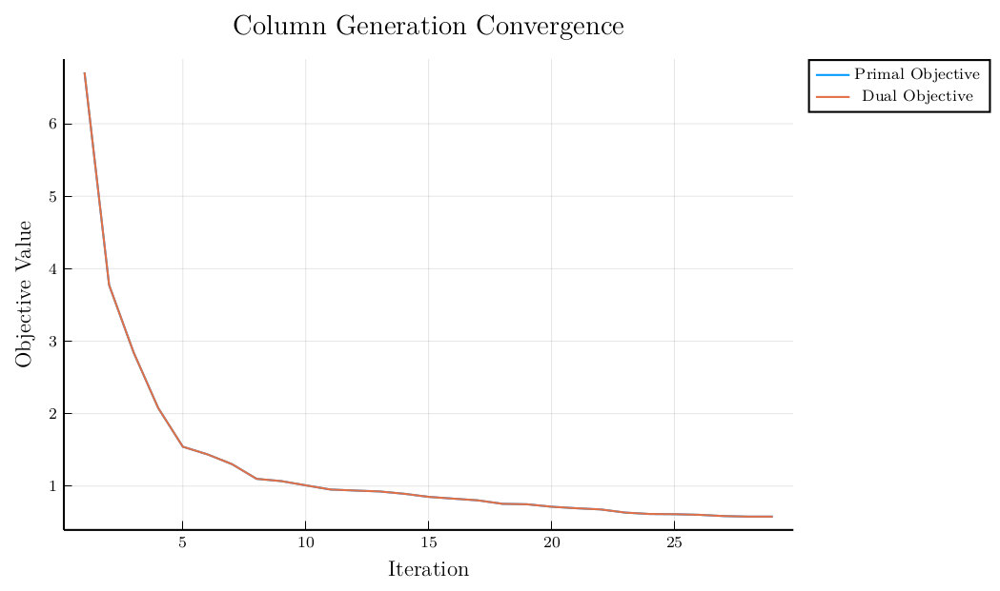

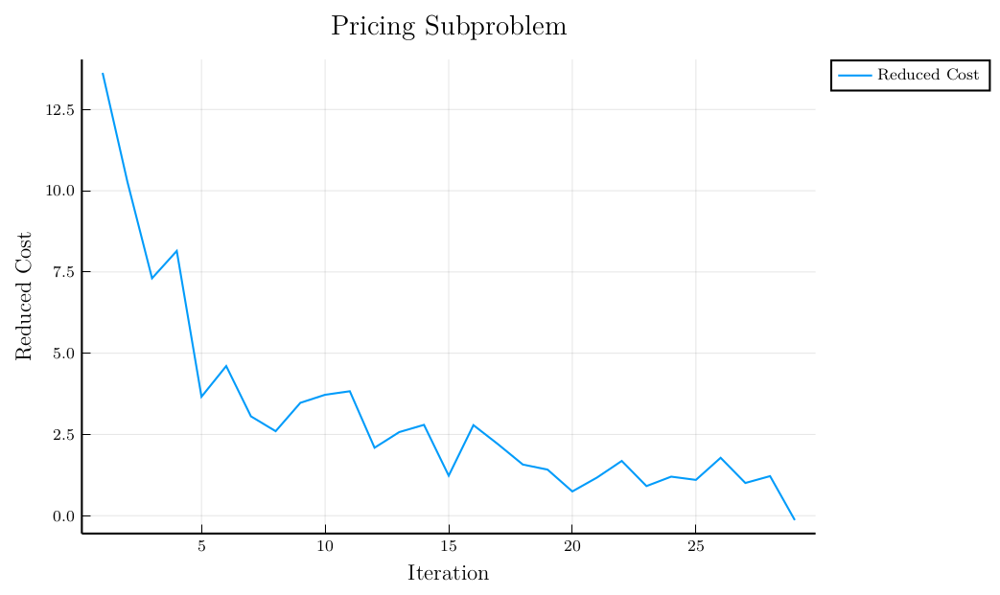

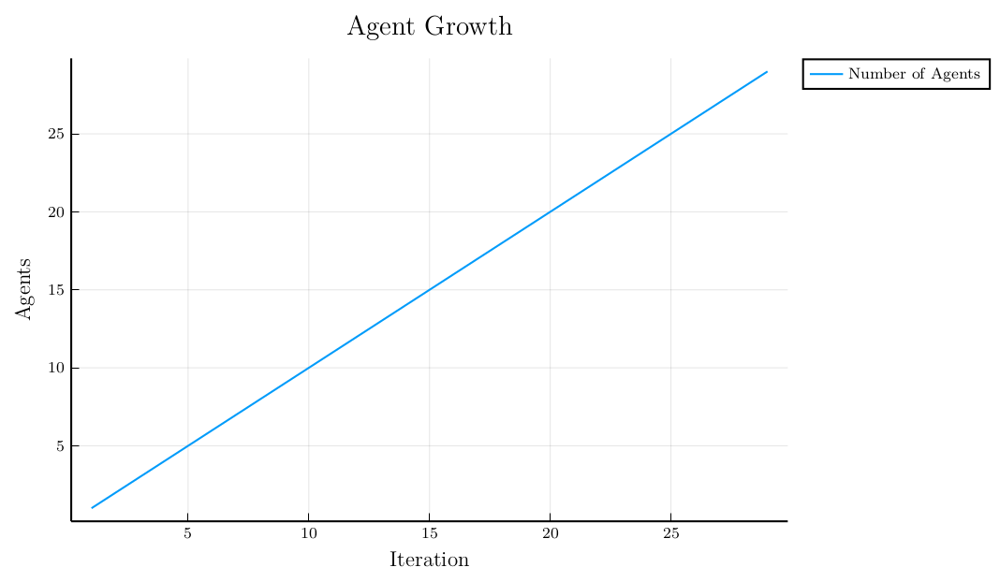

In [22]:
using Plots

p1 = plot(
    history[:primal_obj],
    label="Primal Objective",
    xlabel="Iteration",
    ylabel="Objective Value",
    title="Column Generation Convergence"
)
plot!(p1, history[:dual_obj], label="Dual Objective")
display(p1)

p2 = plot(
    history[:reduced_cost],
    label="Reduced Cost",
    xlabel="Iteration",
    ylabel="Reduced Cost",
    title="Pricing Subproblem"
)
display(p2)

p3 = plot(
    history[:num_agents],
    label="Number of Agents",
    xlabel="Iteration",
    ylabel="Agents",
    title="Agent Growth"
)
display(p3)

## Out-of-sample test

In [23]:
# ------------------------------
# Out-of-sample test (single point)
# ------------------------------
p_test, g_test = Ξ_test[1]
fa_test_single = copy(fa)
alg = HessianBar(n, fa_test_single.m, copy(p_test); linconstr=linconstr)
alg.p .= p_test
play!(alg, fa_test_single)
ga = sum(fa_test_single.x, dims=2)[:]
println("Observed aggregate demand g_test: ", g_test)
println("Fitted aggregate demand ga:   ", ga)
println("Difference:                ", abs.(ga - g_test))
println("Max difference:            ", maximum(abs.(ga - g_test)))

# ------------------------------
# Out-of-sample test (whole set)
# ------------------------------
errs = Float64[]
fa_test_whole = copy(fa)
for (p_k, g_k) in Ξ_test
    alg.p .= p_k
    play!(alg, fa_test_whole)
    ĝ_k = sum(fa_test_whole.x, dims=2)[:]
    push!(errs, mean(abs.(p_k .* (ĝ_k .- g_k))))
end
println("Out-of-sample price-weighted RMSE over K: ", sqrt(mean(errs .^ 2)))

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0250 seconds
FisherMarket initialized in 0.0250 seconds
Observed aggregate demand g_test: [0.0, 0.0, 0.0, 0.0, 4.803569889521782, 0.0, 0.0, 0.0, 12.575445240372307, 0.0]
Fitted aggregate demand ga:   [5.251544878093897e-6, 1.6390753636317883e-5, 0.003796956244407885, 1.7623726780033703e-16, 3.7829739482237708, 3.0496818929599003e-6, 0.25786753978864024, 6.026804378887327e-12, 13.832470440328258, 3.019494076679997e-16]
Difference:                [5.251544878093897e-6, 1.6390753636317883e-5, 0.003796956244407885, 1.7623726780033703e-16, 1.0205959412980112, 3.0496818929599003e-6, 0.25786753978864024, 6.026804378887327e-12, 1.257025199955951, 3.019494076679997e-16]
Max difference:            1.257025199955951
FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0160 seconds
FisherMarket initialized in 0.0160 seconds
Out-of-sample price-weighted RMSE over K: 0.0630846709818307


## Computing surrogate market equilibrium

In [14]:
include("../fisher/setup.jl")
switch_to_pdf(; bool_use_html=false)
table_time = []
results = []
# -----------------------------------------------------------------------
# compute ground truth
# -----------------------------------------------------------------------
ϵ = 1e-12
f_surr = copy(fa)
keep = findall(>(ϵ), f_surr.w)
m2 = length(keep) 
@show f_surr.m m2 length(keep)
@show any(isnan, f_surr.w) any(.!isfinite.(f_surr.w)) sum(f_surr.w) 
f_surr = FisherMarket(m2, n; ρ= f_surr.ρ[keep], c=f_surr.c[:,keep], w=f_surr.w[keep])
@show minimum(f_surr.w)
p₀ = ones(f_surr.n) * sum(f_surr.w) ./ (f_surr.n)
x₀ = ones(f_surr.n, f_surr.m) ./ f_surr.m
f_surr.p .= p₀
f_surr.x .= x₀  
# use log-barrier method to compute ground truth
(name, method, kwargs) = method_kwargs[end]
alg_sur = method(
    f_surr.n, f_surr.m, p₀;
    linconstr=linconstr,
    kwargs...
)
traj = opt!(
    alg_sur, f_surr;
    # loginterval=1,
    keep_traj=true
)
p_surrogate = copy(alg_sur.p)
x_surrogate = copy(f_surr.x)


FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0000 seconds
FisherMarket initialized in 0.0120 seconds
f_surr.m = 29
m2 = 19
length(keep) = 19
any(isnan, f_surr.w) = false
any(.!(isfinite.(f_surr.w))) = false
sum(f_surr.w) = 1.0
FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0000 seconds
FisherMarket initialized in 0.0000 seconds
minimum(f_surr.w) = 5.277500340792615e-5
-------------------------------------------------------------------------
          ExchangeMarket.jl: A Julia Package for Exchange Market          
                          © Chuwen Zhang (2024)                          
-------------------------------------------------------------------------
 subproblem solver alias       := ProportionalResponse
 subproblem solver style       := bids
 option for gradient           := dual
 option for step               := shmyrev
 option for step size          := cc13
------------------------------------------------

10×19 Matrix{Float64}:
 7.73269e-21  0.0675802    2.95627e-19  …  1.82927e-12  3.45013e-22
 2.13681e-5   0.0258329    0.0245176       2.41557e-18  4.90768e-9
 3.56976e-15  8.51499e-12  1.33295e-12     5.83585e-15  1.68757e-15
 0.000611247  0.278556     0.22499         0.103933     1.02966e-7
 1.06377e-5   0.0233713    3.31463e-20     1.72156e-5   3.86774e-13
 2.3075e-20   2.04677e-5   0.996892     …  3.93843e-20  0.00116526
 4.23131e-6   1.45478e-10  0.0530567       2.32658e-14  7.65998e-18
 4.40666e-20  0.0394512    0.792096        1.58126e-5   1.87709e-20
 3.47186e-22  0.0974993    9.98073e-6      2.16478e-6   4.66392e-8
 4.32955e-11  0.994753     2.57561e-16     1.47589e-10  3.0092e-19

In [18]:
f_surr.x
sum(f_surr.x, dims=2)[:]

10-element Vector{Float64}:
 1.0
 0.9999999999999998
 0.9999999999999998
 0.9999999999999998
 0.9999999999999998
 1.0
 0.9999999999999997
 0.9999999999999999
 1.0
 0.9999999999999997

## Validate Ground Truth

In [15]:
validate(f_surr, alg_sur)


------------------------------------------------------------
 :problem size
 :    number of agents: 19
 :    number of goods: 10
 :    avg number of nonzero entries in c: 1.0000
 :equilibrium information
 :method: MirrorDec
------------------------------------------------------------
10×2 DataFrame
 Row │ utility      left_budget  
     │ Float64      Float64      
─────┼───────────────────────────
   1 │ 0.000920196  -1.35525e-20
   2 │ 2.54502      -2.77556e-17
   3 │ 4.0044        0.0
   4 │ 1.46164       0.0
   5 │ 0.0103675     0.0
   6 │ 2.51289       2.77556e-17
   7 │ 0.599141      0.0
   8 │ 0.265985      1.73472e-18
   9 │ 1.34912       0.0
  10 │ 0.0721424     0.0
------------------------------------------------------------
 :(normalized) market excess: [-3.3307e-16, 0.0000e+00]
 :            social welfare:  4.61544143e-01
------------------------------------------------------------


In [16]:
[p_real, p_surrogate]

2-element Vector{Vector{Float64}}:
 [0.10718049341994144, 0.13015593824479668, 0.05332762014894369, 0.077254180249103, 0.16561613301369532, 0.07780059122564295, 0.1244887158946726, 0.0944093920552611, 0.08840419684241407, 0.08136459534543775]
 [0.11770326071734906, 0.09385488960244534, 0.07127188650207036, 0.08026131701140476, 0.1264410219603338, 0.10551082571706888, 0.08625908616241494, 0.10326885674651146, 0.12106607424675661, 0.09436278133364484]

## Column Generation for Linear Agents

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0180 seconds
FisherMarket initialized in 0.0300 seconds
=== Column Generation for Linear (ρ=1) Good-Specialists ===

--- Iteration 1 (1 agents) ---
  Primal obj: 10.694224
  Dual obj:   10.694224
  Best rc:    7.0 at good j=5
  Weights w:  [1.0]
--- Iteration 2 (2 agents) ---
  Primal obj: 8.955817
  Dual obj:   8.955817
  Best rc:    5.0 at good j=1
  Weights w:  [0.6047, 0.3953]
--- Iteration 3 (3 agents) ---
  Primal obj: 8.748818
  Dual obj:   8.748818
  Best rc:    3.5 at good j=6
  Weights w:  [0.5026, 0.2933, 0.2041]
--- Iteration 4 (4 agents) ---
  Primal obj: 8.366667
  Dual obj:   8.366667
  Best rc:    1.0 at good j=2
  Weights w:  [0.285, 0.2974, 0.2041, 0.2134]
--- Iteration 5 (5 agents) ---
  Primal obj: 8.285864
  Dual obj:   8.285864
  Best rc:    0.666667 at good j=8
  Weights w:  [0.2744, 0.2717, 0.1783, 0.169, 0.1066]
--- Iteration 6 (6 agents) ---
  Primal obj: 8.139029
  Dual obj:   8.

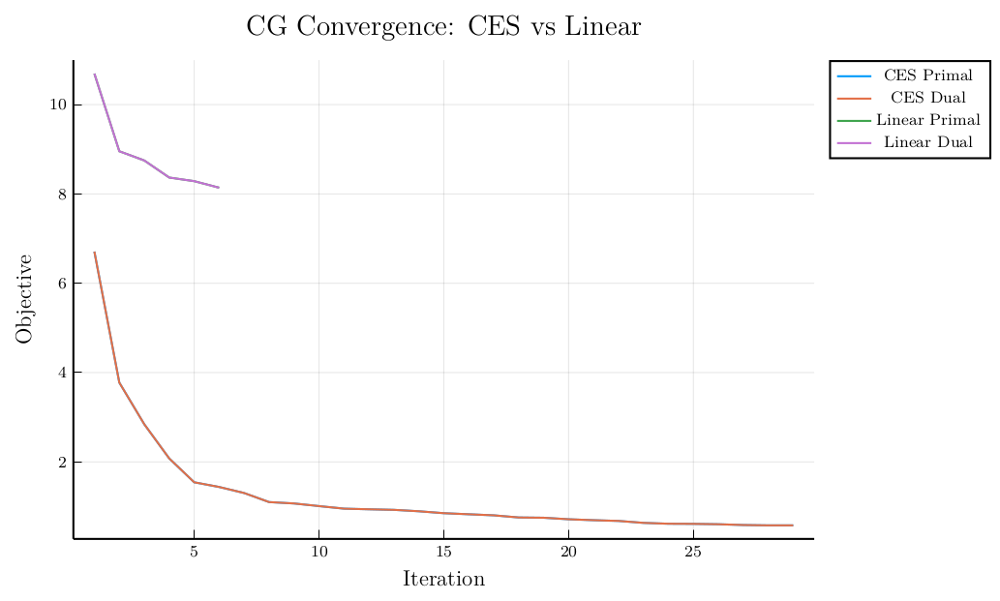

In [ ]:
# ------------------------------
# Linear baseline (ρ = 1) via "good-specialist" agents (c = e_j)
# ------------------------------
using Statistics

K_fit = length(Ξ)

onehot_gamma(j, K, n) = begin
    γ = zeros(Float64, K, n)
    γ[:, j] .= 1.0
    γ
end

function init_linear_market_with_good(j0::Int, n::Int)
    fa_lin = FisherMarket(1, n; ρ=ones(1), scale=30.0, sparsity=0.99)
    fa_lin.c .= 0.0
    fa_lin.c[j0, 1] = 1.0
    return fa_lin
end

# init with one random good
goods = [rand(1:n)]
fa_lin = init_linear_market_with_good(goods[1], n)
γ_ref_lin = Ref(reshape(onehot_gamma(goods[1], K_fit, n), 1, K_fit, n))

history_lin = Dict(
    :primal_obj => Float64[],
    :dual_obj => Float64[],
    :reduced_cost => Float64[],
    :num_agents => Int[]
)

max_iters_lin = n
tol_lin = 1e-6

println("=== Column Generation for Linear (ρ=1) Good-Specialists ===\n")
for iter in 1:max_iters_lin
    println("--- Iteration $iter ($(fa_lin.m) agents) ---")

    w, s, model_primal = solve_master_problem(Ξ, γ_ref_lin[]; verbose=false)
    u, μ, model_dual = solve_dual_problem(Ξ, γ_ref_lin[]; verbose=false)

    primal_obj = objective_value(model_primal)
    dual_obj = objective_value(model_dual)

    push!(history_lin[:primal_obj], primal_obj)
    push!(history_lin[:dual_obj], dual_obj)
    push!(history_lin[:num_agents], fa_lin.m)

    # pricing over goods: rc_j = sum_k u[k,j] - μ, with γ_new = onehot(j)
    rc_best = -Inf
    j_best = 1
    for j in 1:n
        j in goods && continue
        rc_j = sum(u[:, j]) - μ
        if rc_j > rc_best
            rc_best = rc_j
            j_best = j
        end
    end

    push!(history_lin[:reduced_cost], rc_best)

    println("  Primal obj: $(round(primal_obj, digits=6))")
    println("  Dual obj:   $(round(dual_obj, digits=6))")
    println("  Best rc:    $(round(rc_best, digits=6)) at good j=$j_best")
    println("  Weights w:  $(round.(w, digits=4))")

    if rc_best <= tol_lin
        println("\n✓ Converged! No improving good-specialist (rc ≤ $tol_lin)")
        break
    end

    # update existing budgets
    fa_lin.w .= w

    # add new column γ_new
    γ_new = onehot_gamma(j_best, K_fit, n)
    add_to_gamma!(γ_ref_lin, γ_new)
    push!(goods, j_best)

    # add new linear agent (ρ=1, c=e_j)
    c_new = zeros(Float64, n); c_new[j_best] = 1.0
    w_new = 0.0
    add_to_market!(fa_lin, c_new, 1.0, w_new)
end

w_final_lin, _, _ = solve_master_problem(Ξ, γ_ref_lin[]; verbose=false)
fa_lin.w .= w_final_lin

println("\n=== Linear Final Results ===")
println("Number of fitted agents: $(fa_lin.m)")
println("Number of nonzero agents: $(sum(w_final_lin .> 1e-6))")
println("Final weights: $(round.(w_final_lin, digits=4))")

# ------------------------------
# Plot CES vs Linear (same figure)
# ------------------------------
using Plots

p_cmp = plot(history[:primal_obj], label="CES Primal", xlabel="Iteration", ylabel="Objective", title="CG Convergence: CES vs Linear")
plot!(p_cmp, history[:dual_obj], label="CES Dual")
plot!(p_cmp, history_lin[:primal_obj], label="Linear Primal")
plot!(p_cmp, history_lin[:dual_obj], label="Linear Dual")
display(p_cmp)

# ------------------------------
# Fit diagnostics for Linear (same style as CES diagnostics)
# ------------------------------
p0_eval = ones(n) ./ n
alg_eval_lin = HessianBar(n, fa_lin.m, copy(p0_eval); linconstr=linconstr)
alg_eval_lin.linsys = :direct

err_inf_lin = zeros(Float64, K_fit)
err_l1_lin  = zeros(Float64, K_fit)
rel_l1_lin  = zeros(Float64, K_fit)

for k in 1:K_fit
    p_k, g_k = Ξ[k]
    alg_eval_lin.p .= p_k
    play!(alg_eval_lin, fa_lin; all=true)
    ga_k = sum(fa_lin.x, dims=2)[:]
    d = ga_k - g_k
    err_inf_lin[k] = maximum(abs.(d))
    err_l1_lin[k]  = sum(abs.(d))
    rel_l1_lin[k]  = err_l1_lin[k] / (sum(abs.(g_k)) + 1e-12)
end

println("\n=== Fit Diagnostics (Linear surrogate vs PWL truth) ===")
println("K = ", K_fit, ", fa_lin.m = ", fa_lin.m, ", nonzero weights = ", sum(fa_lin.w .> 1e-6))
println("inf err: max = ", maximum(err_inf_lin), ", mean = ", mean(err_inf_lin))
println("L1  err: max = ", maximum(err_l1_lin),  ", mean = ", mean(err_l1_lin))
println("rel L1:  max = ", maximum(rel_l1_lin),  ", mean = ", mean(rel_l1_lin))


## Scale-out Experiments

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0000 seconds
FisherMarket initialized in 0.0000 seconds
FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0000 seconds
FisherMarket initialized in 0.0170 seconds
Computing demand for observation 1 at prices: [0.06443662192423216, 0.1592536988101193, 0.16376306628046666, 0.07043095901724694, 0.09326057826535131, 0.12309727737344604, 0.07354637434027693, 0.061613510435938525, 0.05481604337208118, 0.13578187018084087]
Computing demand for observation 2 at prices: [0.0884821035533712, 0.1442029078968649, 0.09169822692905838, 0.09666256367631479, 0.15533103617966368, 0.04488456272550045, 0.04768684203577771, 0.07558724122925634, 0.10361948397449136, 0.15184503179970124]
Computing demand for observation 3 at prices: [0.05849824799149618, 0.12816197793780548, 0.12043672958634717, 0.11230537997510678, 0.18071876140443127, 0.14392735303922297, 0.054264768038122316, 0.09222616061157263

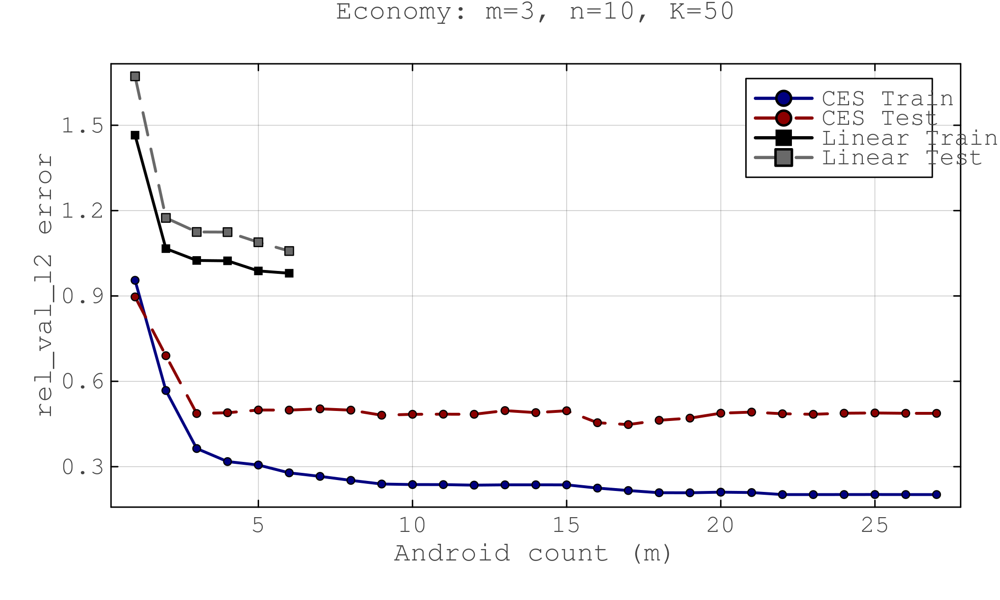

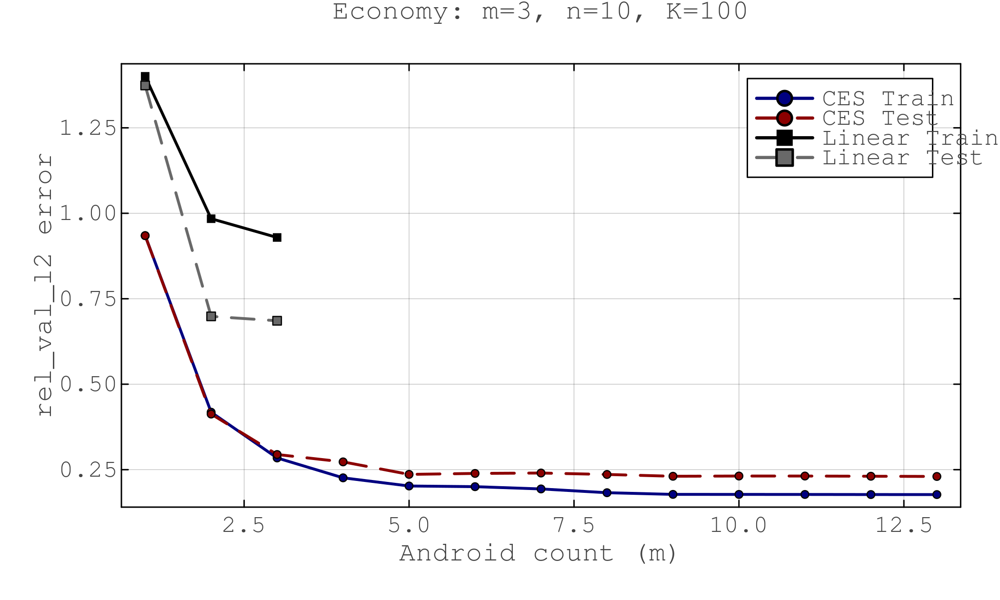

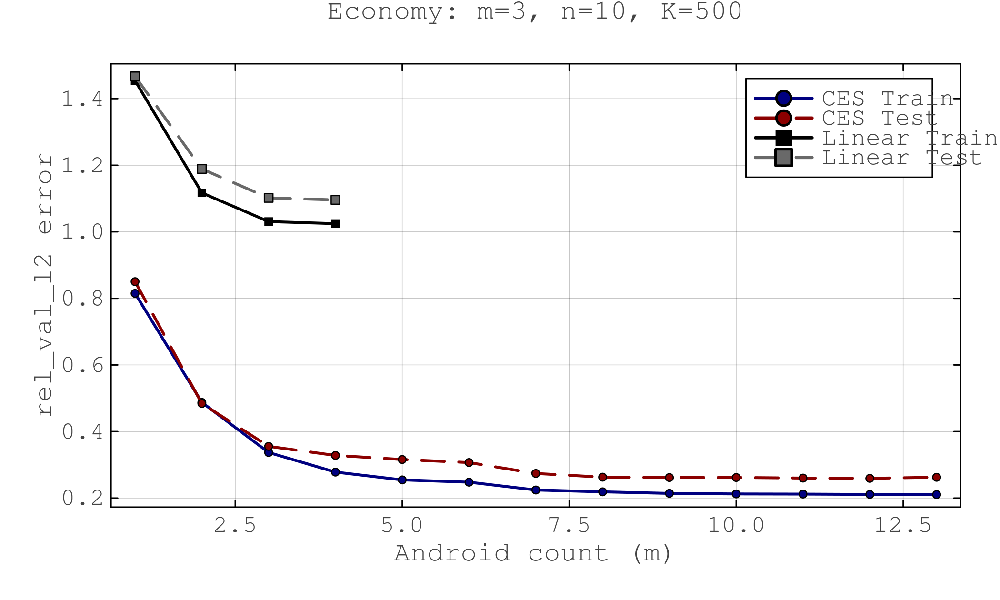

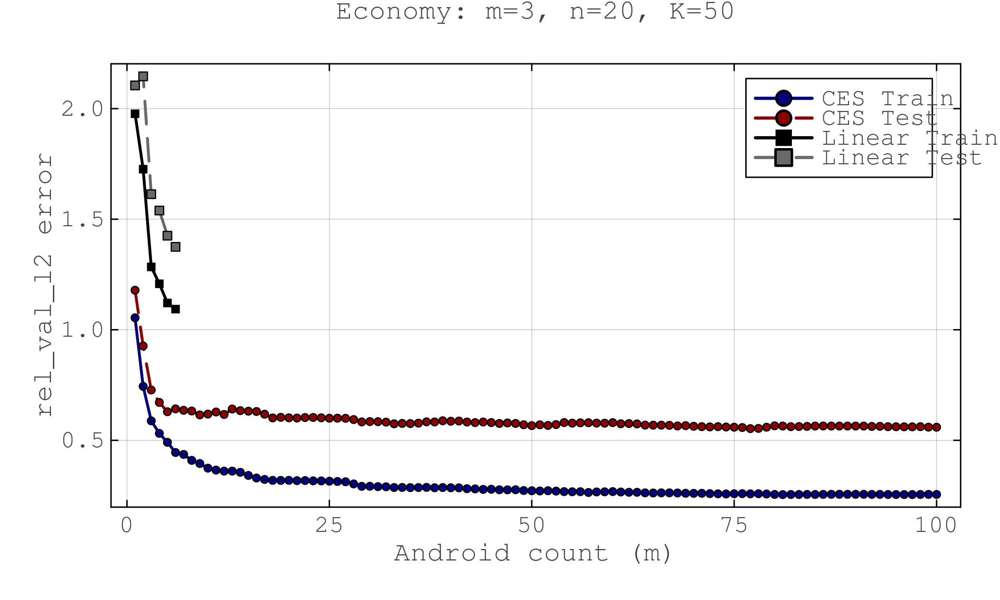

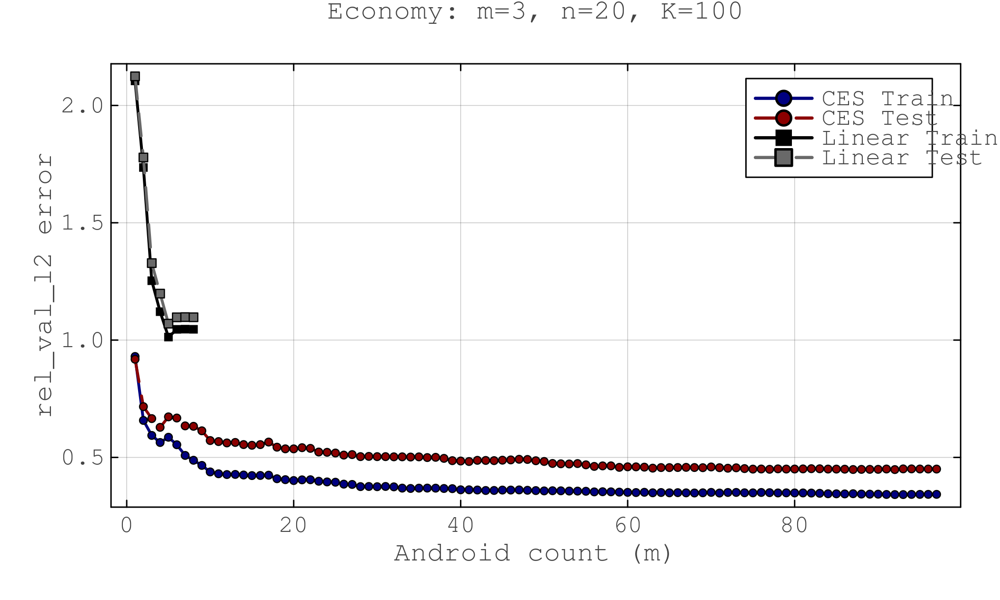

Excessive output truncated after 524288 bytes.

Computing demand for observation 256 at prices: [0.05554687917899286, 0.04118171653061107, 0.05203793355341545, 0.03687499716933067, 0.07425791338728337, 0.035521662039150984, 0.04289150757483301, 0.06557400620003345, 0.06086656799635632, 0.05594257682152174, 0.03577924887620887, 0.034239649080625954, 0.02720763935192477, 0.04315230482796936, 0.06028995945047686, 0.06576395167106967, 0.044132441799052, 0.040389840026821534, 0.05352720632561947, 0.07482199813870251]
Computing demand for observation 257 at prices: [0.07258808486897896, 0.02409501350099538, 

In [ ]:
# =========================================================
# Scale-out Experiments: vary m / n / K
# For each economy: plot android count vs train/test error
# CES and Linear in the same figure
# =========================================================
using Random, Statistics, LinearAlgebra, Plots, Measures
using Plots
gr()
outdir = joinpath("..", "results", "exp_conv")
mkpath(outdir)
# ----------------------------
# Experiment config (edit here)
# ----------------------------
base_m = 3      # true agents
base_n = 10     # goods
base_K = 50     # sample size

m_list = [3, 5, 8]
n_list = [10, 20, 50]
K_list = [50, 100, 500]

train_frac = 0.8
L_max = 4
scale = 1.0
seed_base = 123

max_iters_ces = 100
max_iters_lin = 100
tol_cg = 1e-4

metric = :rel_val_l2  # :rel_l1 / :rel_l2 / :rel_val_l1 / :rel_val_l2 / :l1 / :inf  / :rmse / :val_rmse

# output
outdir = joinpath(pwd(), "..", "results", "exp_scale")
mkpath(outdir)

# ----------------------------
# Helpers
# ----------------------------
function split_train_test(Ξ; frac=0.8, seed=1)
    Random.seed!(seed)
    K = length(Ξ)
    perm = shuffle(1:K)
    K_train = Int(round(frac * K))
    train_idx = perm[1:K_train]
    test_idx  = perm[K_train+1:end]
    return Ξ[train_idx], Ξ[test_idx]
end

function build_pwl_ground_truth(m::Int, n::Int; L_max=4, scale=1.0, seed=1)
    Random.seed!(seed)
    A_gt = zeros(Float64, n, L_max, m)
    b_gt = zeros(Float64, L_max, m)
    for i in 1:m
        base_pref = ones(n) .+ 0.5 * rand(n)
        base_pref ./= sum(base_pref)
        for l in 1:L_max
            noise = (rand(n) .- 0.5) * 0.1
            a_vec = max.(1e-4, base_pref .+ noise)
            layer_scale = scale * (0.8 + rand())
            A_gt[:, l, i] = a_vec * layer_scale
            b_gt[l, i] = 0.0
        end
    end
    f0 = FisherMarket(m, n; A_planes=A_gt, b_planes=b_gt, scale=scale)
    return f0
end

function generate_Xi(f0::FisherMarket, K::Int; seed=1)
    n = f0.n
    m = f0.m
    f1 = copy(f0)
    p0 = ones(n) ./ n
    f1.x .= ones(n, m) ./ m
    pwl_optimizer = PiecewiseLPResponse()
    alg = MirrorDec(
        n, m, copy(p0);
        optimizer=pwl_optimizer,
        option_grad=:dual,
        option_step=:eg,
        option_stepsize=:cc13,
        tol=1e-6,
        maxiter=1000
    )
    Ξ = produce_revealed_preferences(alg, f1, K; seed=seed)
    return Ξ
end

function compute_errors(ga::Vector{T}, g::Vector{T}, p::Vector{T}) where T
    # quantity errors
    d_qty = ga - g
    err_inf = maximum(abs.(d_qty))
    err_l1  = sum(abs.(d_qty))
    err_l2  = sqrt(sum(d_qty .^ 2))
    rel_l1  = err_l1 / (sum(abs.(g)) + 1e-12)
    rel_l2  = err_l2 / (sqrt(sum(g .^ 2)) + 1e-12)

    # value errors (price-weighted)
    d_val = p .* d_qty
    val_l1  = sum(abs.(d_val))
    val_l2  = sqrt(sum(d_val .^ 2))
    rel_val_l1 = val_l1 / (sum(abs.(p .* g)) + 1e-12)
    rel_val_l2 = val_l2 / (sqrt(sum((p .* g) .^ 2)) + 1e-12)
    budget_gap = abs(dot(p, ga) - dot(p, g))

    return (
        inf=err_inf,
        l1=err_l1,
        l2=err_l2,
        rel_l1=rel_l1,
        rel_l2=rel_l2,
        val_l1=val_l1,
        val_l2=val_l2,
        rel_val_l1=rel_val_l1,
        rel_val_l2=rel_val_l2,
        budget_gap=budget_gap
    )
end


function mean_error_over_set(Ξ, ga_fn; metric=:rel_l1)
    vals = Float64[]
    for (p_k, g_k) in Ξ
        ga_k = ga_fn(p_k)
        e = compute_errors(ga_k, g_k, p_k)
        push!(vals, getfield(e, metric))
    end
    return mean(vals)
end

function rmse(a::AbstractVector{T}, b::AbstractVector{T}) where T
    return sqrt(mean((a .- b).^2))
end

function mean_rmse_over_set(Ξ, ga_fn)
    vals = Float64[]
    for (p_k, g_k) in Ξ
        ga_k = ga_fn(p_k)
        push!(vals, rmse(ga_k, g_k))
    end
    return mean(vals)
end

function mean_value_rmse_over_set(Ξ, ga_fn)
    vals = Float64[]
    for (p_k, g_k) in Ξ
        ga_k = ga_fn(p_k)
        push!(vals, rmse(p_k .* ga_k, p_k .* g_k))
    end
    return mean(vals)
end

# closed-form linear specialist demand with budget w
function linear_specialist_demand(p::AbstractVector{T}, j::Int; w::T=1.0) where T
    n = length(p)
    x = zeros(T, n)
    ratio = 1.0 ./ p
    maxv = maximum(ratio)
    idxs = findall(ratio .== maxv)
    x[idxs] .= (w / length(idxs)) ./ p[idxs]
    return x
end

function compute_linear_demand_matrix(goods::Vector{Int}, Ξ, n::Int)
    N = length(goods)
    K = length(Ξ)
    x = zeros(Float64, N, K, n)
    for (r, j) in enumerate(goods)
        for k in 1:K
            p_k, g_k = Ξ[k]
            W_k = dot(p_k, g_k)
            x[r, k, :] = linear_specialist_demand(p_k, j; w=W_k)
        end
    end
    return x
end

# ----------------------------
# CES CG run (track errors per iteration)
# ----------------------------
function run_cg_ces(Ξ_train, Ξ_test, n::Int;
    max_iters=20, tol=1e-6, metric=:rel_l1, seed=seed_base)
    Random.seed!(seed)
    linconstr = LinearConstr(1, n, ones(1, n), [1.0])

    fa = FisherMarket(1, n; ρ=rand(1), scale=30.0, sparsity=0.99)
    γ_ref = Ref(compute_gamma_from_market(fa, Ξ_train))

    m_hist = Int[]
    err_train = Float64[]
    err_test  = Float64[]

    for iter in 1:max_iters
        w, s, model_primal = solve_master_problem(Ξ_train, γ_ref[]; verbose=false)
        u, μ, model_dual = solve_dual_problem(Ξ_train, γ_ref[]; verbose=false)

        # update weights
        fa.w .= w

        # evaluate errors
        alg_eval = HessianBar(n, fa.m, ones(n) ./ n; linconstr=linconstr)
        alg_eval.linsys = :direct
        fa_eval = copy(fa)   
        ga_fn = p_k -> begin
            alg_eval.p .= p_k
            play!(alg_eval, fa_eval; all=true)
            sum(fa_eval.x, dims=2)[:]
        end

        push!(m_hist, fa.m)
        if metric == :rmse
            push!(err_train, mean_rmse_over_set(Ξ_train, ga_fn))
            push!(err_test,  mean_rmse_over_set(Ξ_test,  ga_fn))
        elseif metric == :val_rmse
            push!(err_train, mean_value_rmse_over_set(Ξ_train, ga_fn))
            push!(err_test,  mean_value_rmse_over_set(Ξ_test,  ga_fn))
        else
            push!(err_train, mean_error_over_set(Ξ_train, ga_fn; metric=metric))
            push!(err_test,  mean_error_over_set(Ξ_test,  ga_fn; metric=metric))
        end
        # pricing (CES)
        y, σ, γ_new, obj_val = solve_pricing(Ξ_train, u, verbose=false)
        rc = reduced_cost(γ_new, u, μ)
        if rc <= tol
            break
        end
        add_to_gamma!(γ_ref, γ_new)
        c_new, ρ_new = recover_ces_params(y, σ)
        add_to_market!(fa, c_new, ρ_new, 0.0)
    end

    return (m_hist=m_hist, err_train=err_train, err_test=err_test)
end

# ----------------------------
# Linear CG run (track errors per iteration) - good-specialist via gamma
# ----------------------------
function run_cg_linear(Ξ_train, Ξ_test, n::Int;
    max_iters=50, tol=1e-6, metric=:rel_l1, seed=seed_base)
    Random.seed!(seed)
    K_fit = length(Ξ_train)

    onehot_gamma(j, K, n) = begin
        γ = zeros(Float64, K, n)
        γ[:, j] .= 1.0
        γ
    end

    function init_linear_market_with_good(j0::Int, n::Int)
        fa_lin = FisherMarket(1, n; ρ=ones(1), scale=30.0, sparsity=0.99)
        fa_lin.c .= 0.0
        fa_lin.c[j0, 1] = 1.0
        return fa_lin
    end

    goods = [rand(1:n)]
    fa_lin = init_linear_market_with_good(goods[1], n)
    γ_ref_lin = Ref(reshape(onehot_gamma(goods[1], K_fit, n), 1, K_fit, n))

    m_hist = Int[]
    err_train = Float64[]
    err_test  = Float64[]

    for iter in 1:max_iters
        w, s, model_primal = solve_master_problem(Ξ_train, γ_ref_lin[]; verbose=false)
        u, μ, model_dual = solve_dual_problem(Ξ_train, γ_ref_lin[]; verbose=false)

        # update weights for eval
        fa_lin.w .= w

        # error eval via play! on fa_lin (copy for safety)
        linconstr = LinearConstr(1, n, ones(1, n), [1.0])
        alg_eval = HessianBar(n, fa_lin.m, ones(n) ./ n; linconstr=linconstr)
        alg_eval.linsys = :direct
        fa_eval = copy(fa_lin)

        function agg_error(Ξ_set)
            vals = Float64[]
            for (p_k, g_k) in Ξ_set
                alg_eval.p .= p_k
                play!(alg_eval, fa_eval; all=true)
                ga_k = sum(fa_eval.x, dims=2)[:]
                if metric == :rmse
                    push!(vals, rmse(ga_k, g_k))
                elseif metric == :val_rmse
                    push!(vals, rmse(p_k .* ga_k, p_k .* g_k))
                else
                    e = compute_errors(ga_k, g_k, p_k)
                    push!(vals, getfield(e, metric))
                end
            end
            return mean(vals)
        end


        push!(m_hist, fa_lin.m)
        push!(err_train, agg_error(Ξ_train))
        push!(err_test,  agg_error(Ξ_test))

        # pricing: exact good-specialist
        rc_best = -Inf
        j_best = 1
        for j in 1:n
            j in goods && continue
            rc_j = sum(u[:, j]) - μ
            if rc_j > rc_best
                rc_best = rc_j
                j_best = j
            end
        end
        if rc_best <= tol
            break
        end

        # add new column + agent
        γ_new = onehot_gamma(j_best, K_fit, n)
        add_to_gamma!(γ_ref_lin, γ_new)
        push!(goods, j_best)

        c_new = zeros(Float64, n); c_new[j_best] = 1.0
        add_to_market!(fa_lin, c_new, 1.0, 0.0)
    end

    return (m_hist=m_hist, err_train=err_train, err_test=err_test)
end


# ----------------------------
# Plotting
# ----------------------------
function plot_one_economy(res_ces, res_lin; title="")
    default(
        fontfamily="Times New Roman",
        linewidth=2.0,
        markersize=3.0,
        framestyle=:box,
        grid=true,
        gridalpha=0.12,
        gridlinewidth=0.5,
        legend=:topright,
        dpi=300,
        size=(700, 420),   
        left_margin=7mm, right_margin=5mm, top_margin=6mm, bottom_margin=7mm,
        guidefontsize=10, tickfontsize=9, legendfontsize=9, titlefontsize=10
    )
    p = plot(res_ces.m_hist, res_ces.err_train, label="CES Train",
             marker=:circle, color=:navy)
    plot!(p, res_ces.m_hist, res_ces.err_test, label="CES Test",
          linestyle=:dash, marker=:circle, color=:darkred)
    plot!(p, res_lin.m_hist, res_lin.err_train, label="Linear Train",
          marker=:square, color=:black)
    plot!(p, res_lin.m_hist, res_lin.err_test, label="Linear Test",
          linestyle=:dash, marker=:square, color=:dimgray)
    xlabel!(p, "Android count (m)")
    ylabel!(p, string(metric, " error"))
    title!(p, title)  
    return p
end


# ----------------------------
# Run experiments (grid over m, n, K)
# ----------------------------
configs = [(m, n, K) for m in m_list for n in n_list for K in K_list]

for (m_true, n_true, K_true) in configs
    seed = seed_base + m_true + 10*n_true + K_true
    f0 = build_pwl_ground_truth(m_true, n_true; L_max=L_max, scale=scale, seed=seed)
    Ξ = generate_Xi(f0, K_true; seed=seed)
    Ξ_train, Ξ_test = split_train_test(Ξ; frac=train_frac, seed=seed)

    res_ces = run_cg_ces(Ξ_train, Ξ_test, n_true; max_iters=max_iters_ces, tol=tol_cg, metric=metric, seed=seed)
    res_lin = run_cg_linear(Ξ_train, Ξ_test, n_true; max_iters=max_iters_lin, tol=tol_cg, metric=metric, seed=seed)

    ttl = "Economy: m=$m_true, n=$n_true, K=$K_true"
    p = plot_one_economy(res_ces, res_lin; title=ttl)
    display(p)
    # filename + save
    fname = "m$(m_true)_n$(n_true)_K$(K_true)_$(String(metric)).png"
    savefig(p, joinpath(outdir, fname))
end


## Economy test

FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0010 seconds
FisherMarket initialized in 0.0010 seconds
FisherMarket initialization started...
FisherMarket cost matrix initialized in 0.0210 seconds
FisherMarket initialized in 0.0210 seconds
Computing demand for observation 1 at prices: [0.06443662192423216, 0.1592536988101193, 0.16376306628046666, 0.07043095901724694, 0.09326057826535131, 0.12309727737344604, 0.07354637434027693, 0.061613510435938525, 0.05481604337208118, 0.13578187018084087]
Computing demand for observation 2 at prices: [0.0884821035533712, 0.1442029078968649, 0.09169822692905838, 0.09666256367631479, 0.15533103617966368, 0.04488456272550045, 0.04768684203577771, 0.07558724122925634, 0.10361948397449136, 0.15184503179970124]
Computing demand for observation 3 at prices: [0.05849824799149618, 0.12816197793780548, 0.12043672958634717, 0.11230537997510678, 0.18071876140443127, 0.14392735303922297, 0.054264768038122316, 0.09222616061157263

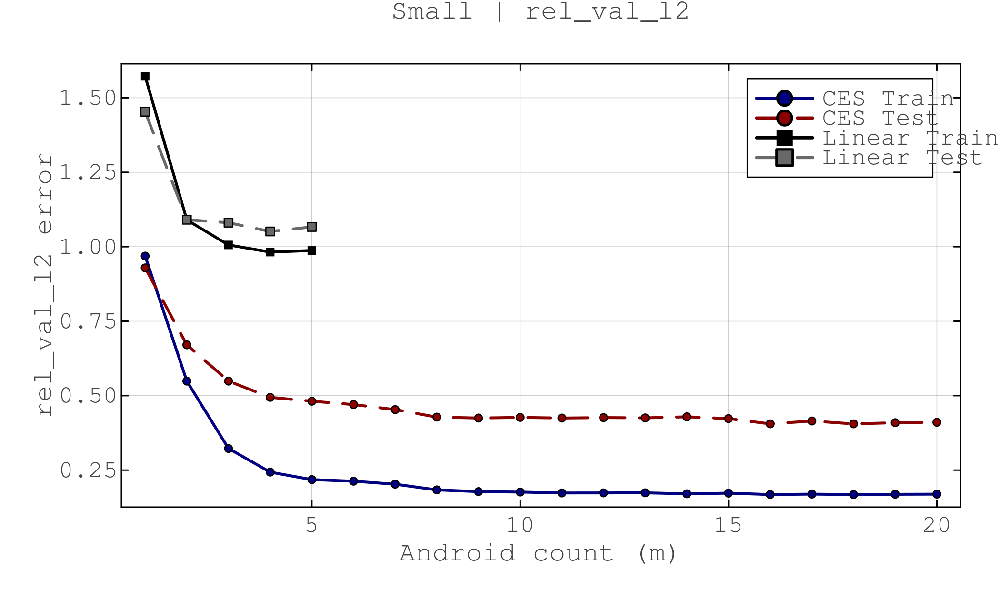

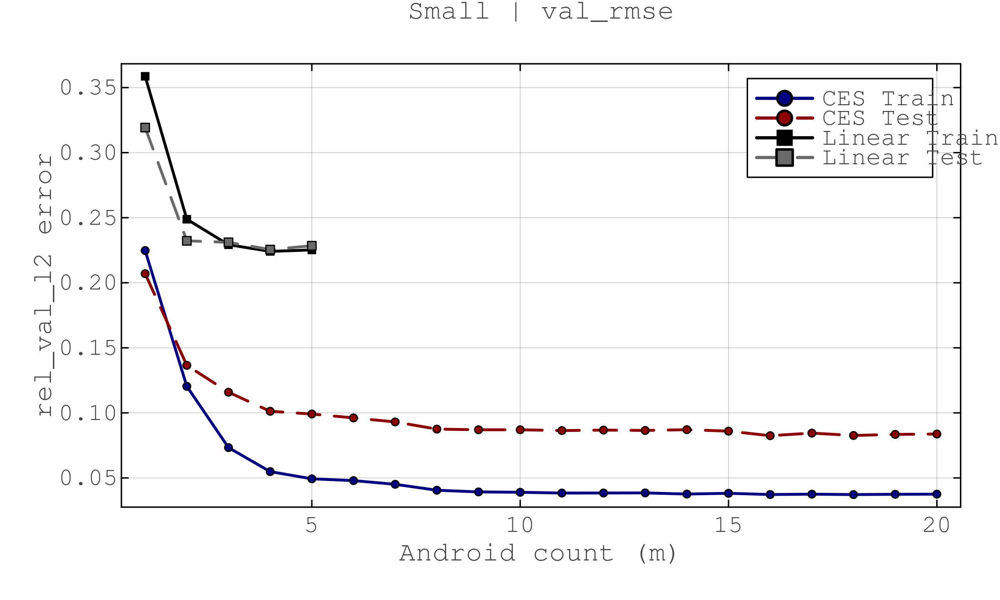

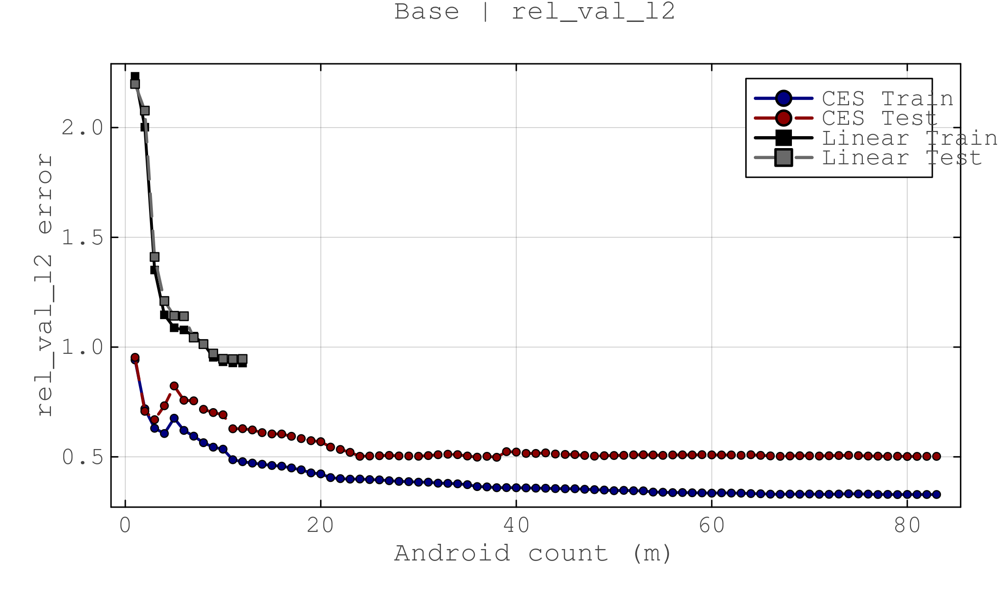

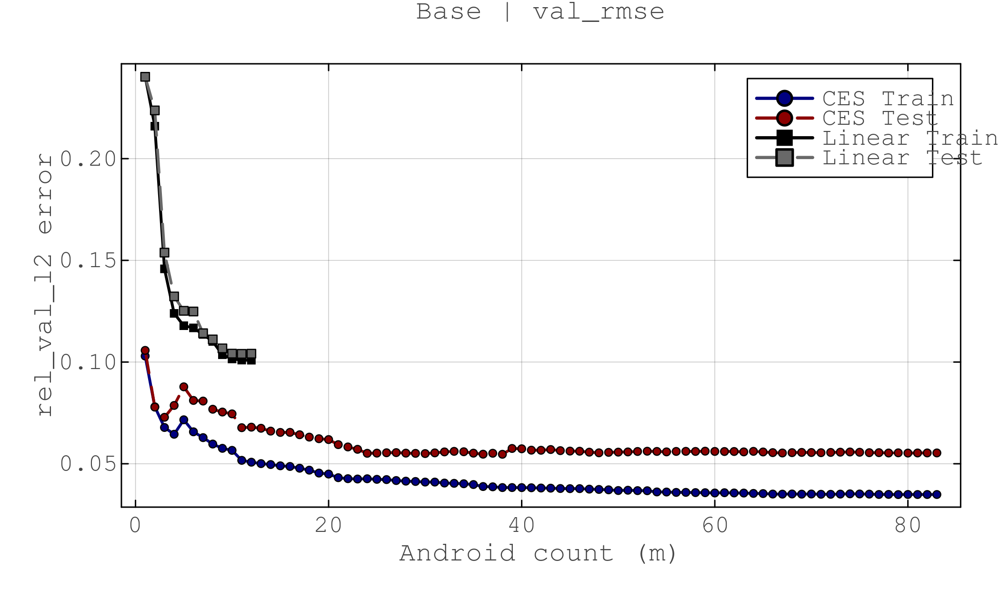

Excessive output truncated after 524295 bytes.

FisherMarket initialization started...

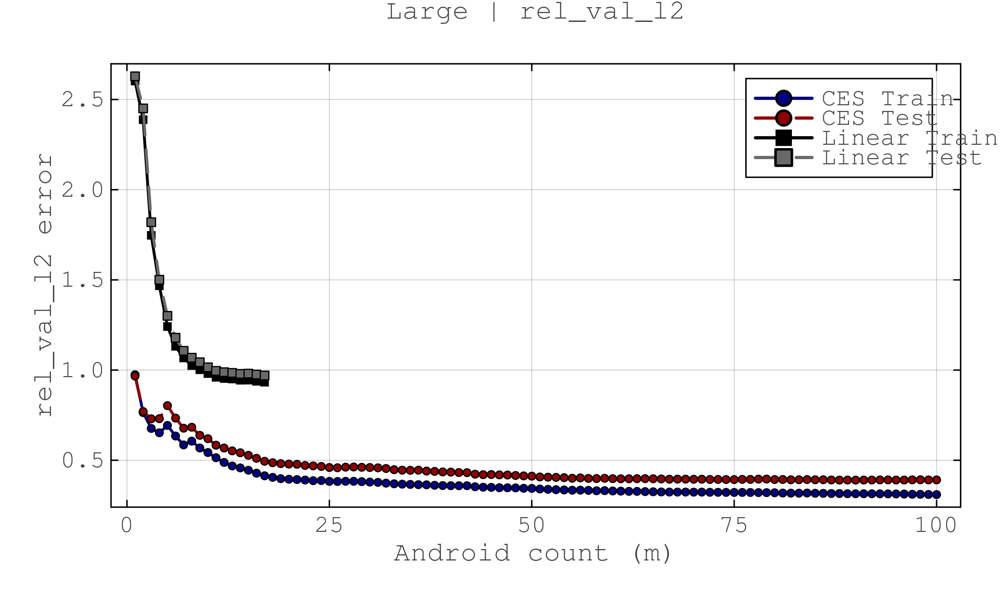

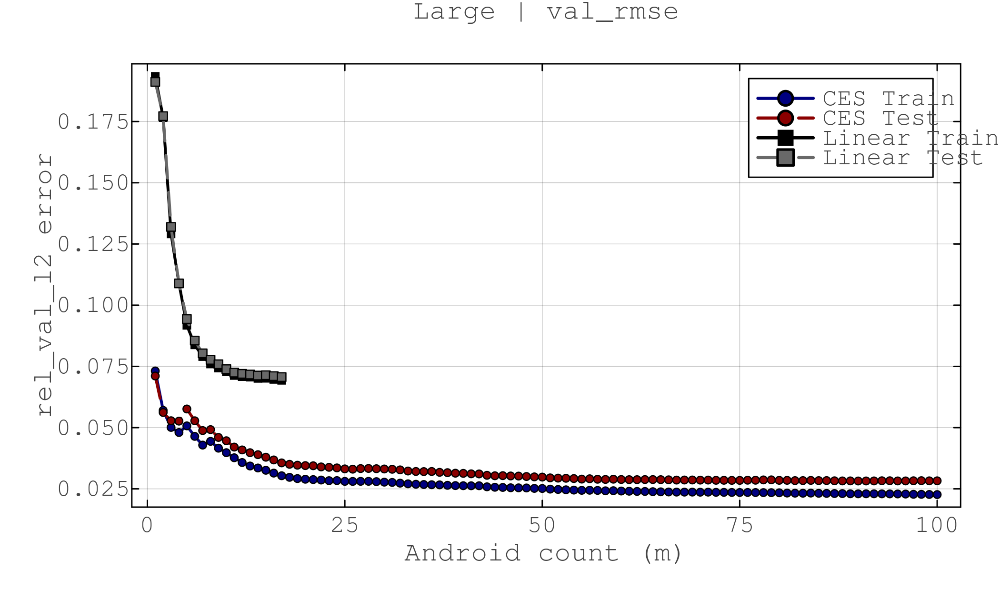

In [20]:
# ----------------------------
# Convergence Experiments 
# ----------------------------
economies = [
    ("Small", 3, 10, 50),
    ("Base",  5, 20, 100),
    ("Large", 8, 30, 200)
]

metrics = [:rel_val_l2, :val_rmse]

max_iters_ces = 100
max_iters_lin = 100
tol_cg = 1e-4
seed_base = 123

for (tag, m_true, n_true, K_true) in economies
    seed = seed_base + m_true + 10*n_true + K_true
    f0 = build_pwl_ground_truth(m_true, n_true; L_max=L_max, scale=scale, seed=seed)
    Ξ = generate_Xi(f0, K_true; seed=seed)
    Ξ_train, Ξ_test = split_train_test(Ξ; frac=train_frac, seed=seed)

    for metric in metrics
        res_ces = run_cg_ces(Ξ_train, Ξ_test, n_true; max_iters=max_iters_ces, tol=tol_cg, metric=metric)
        res_lin = run_cg_linear(Ξ_train, Ξ_test, n_true; max_iters=max_iters_lin, tol=tol_cg, metric=metric)

        # short, paper-style title
        ttl = "$tag | $(String(metric))"
        p = plot_one_economy(res_ces, res_lin; title=ttl)
        display(p)

        # filename + save
        fname = "conv_$(tag)_m$(m_true)_n$(n_true)_K$(K_true)_$(String(metric)).png"
        savefig(p, joinpath(outdir, fname))
    end
end


m=3, n=10, K=50
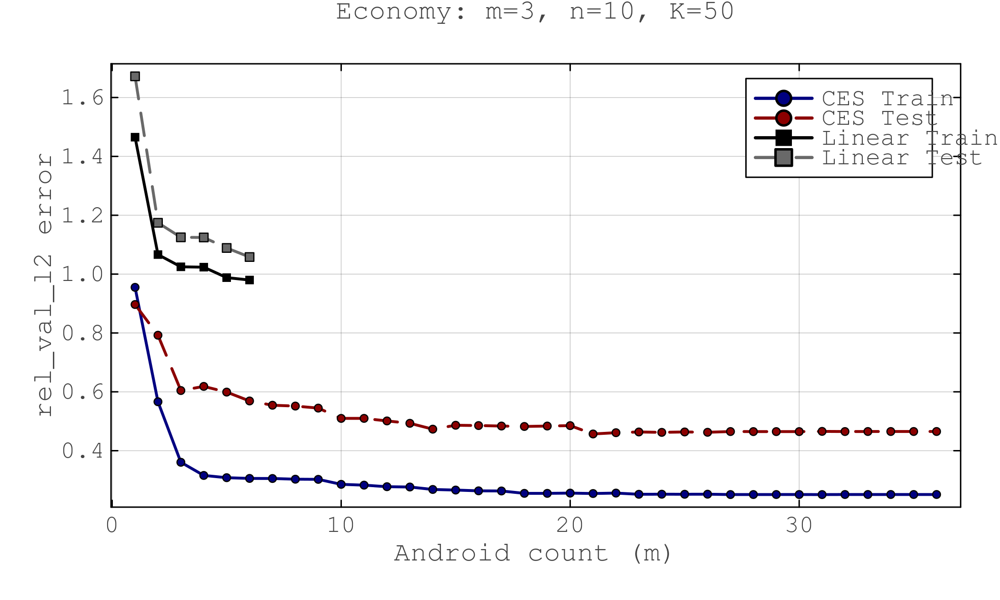

m=3, n=10, K=100
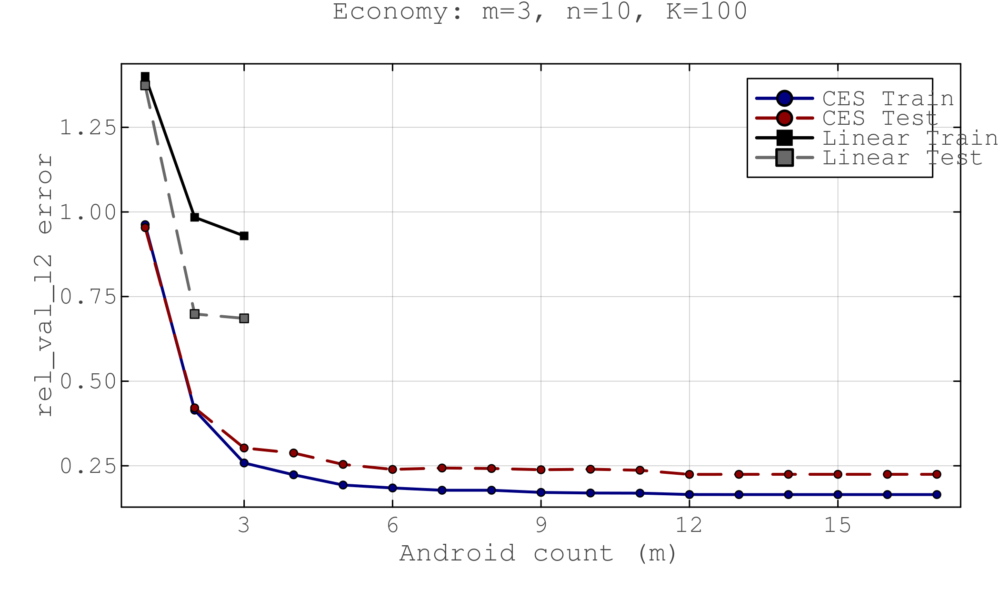

m=3, n=10, K=500
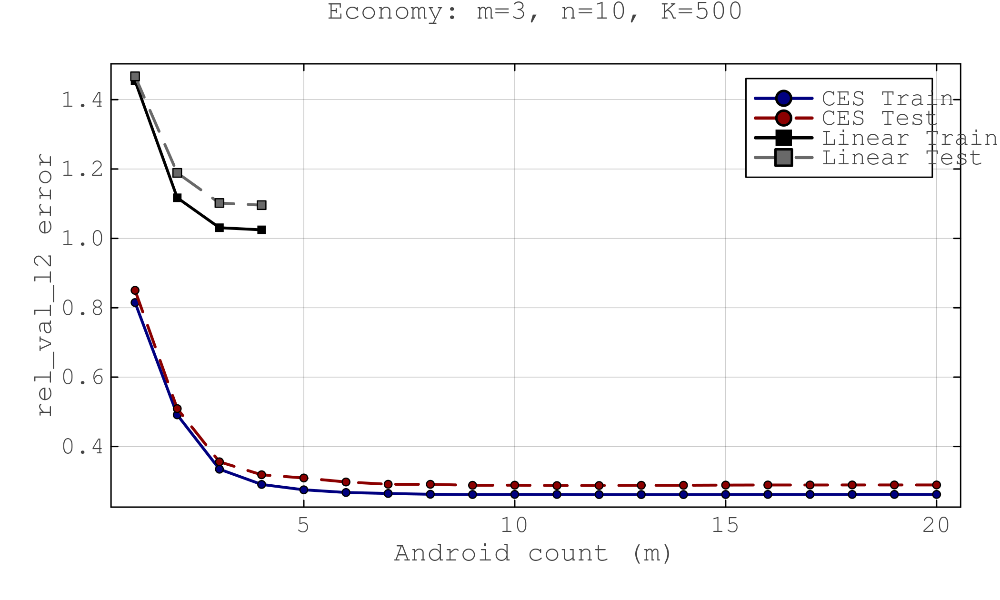

m=3, n=20, K=50
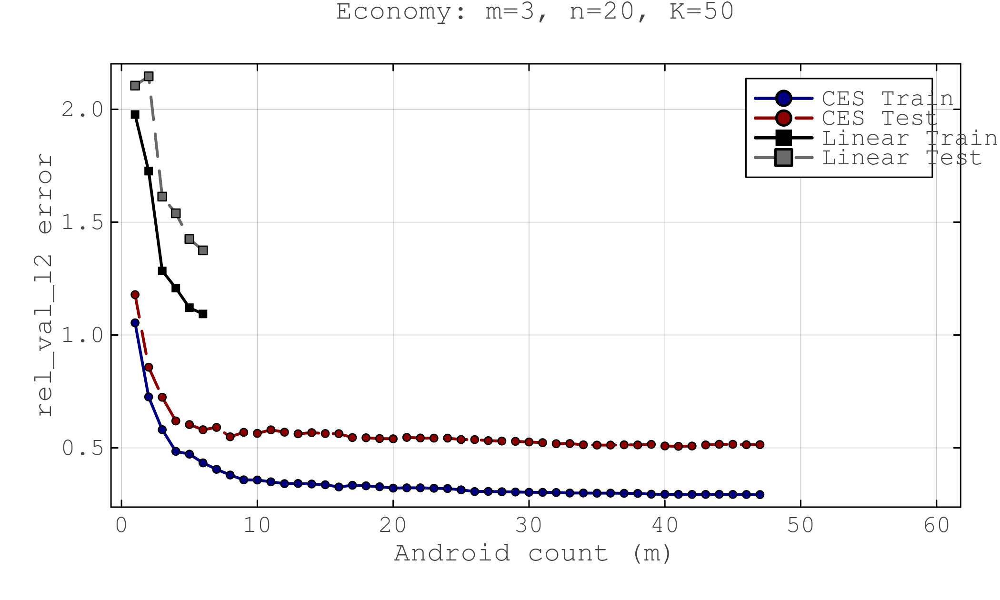

m=3, n=20, K=100
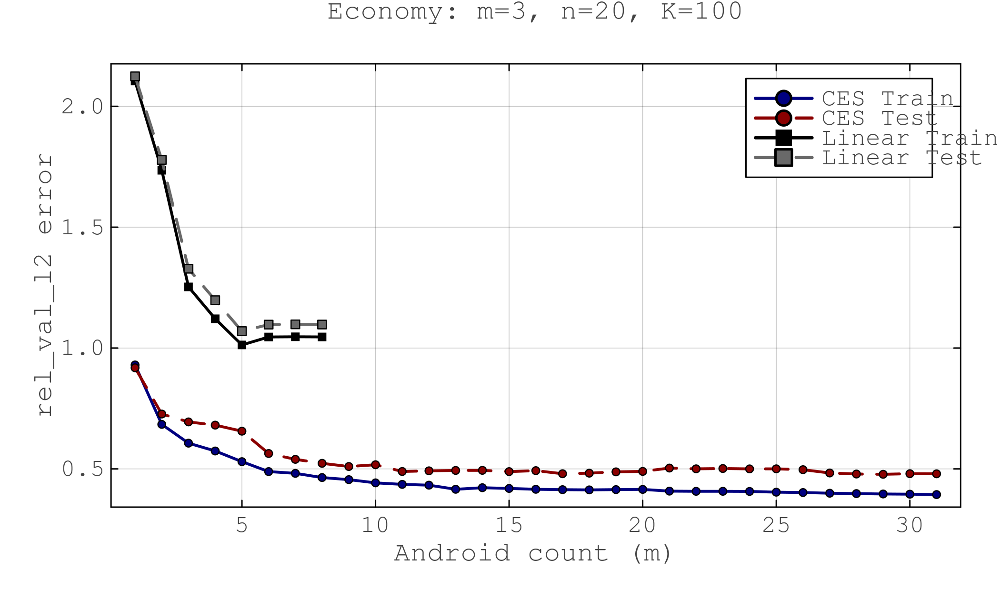

m=3, n=20, K=500
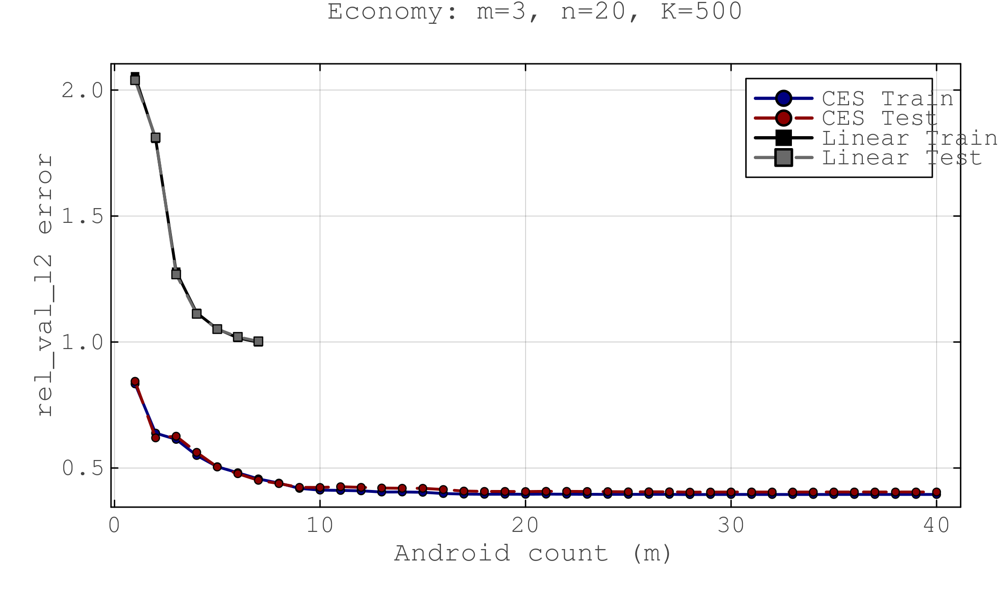

m=3, n=50, K=50
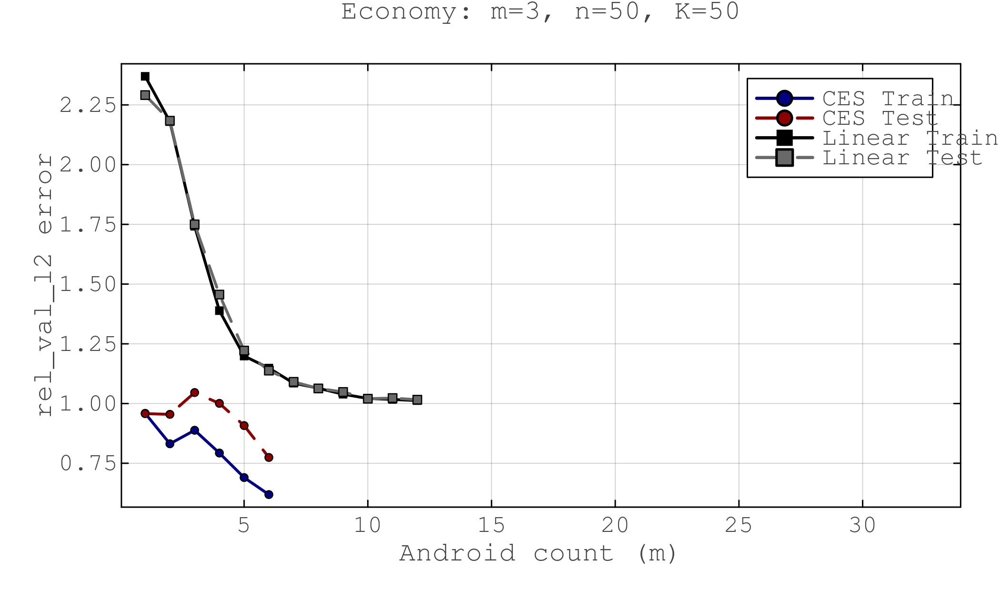

m=3, n=50, K=100
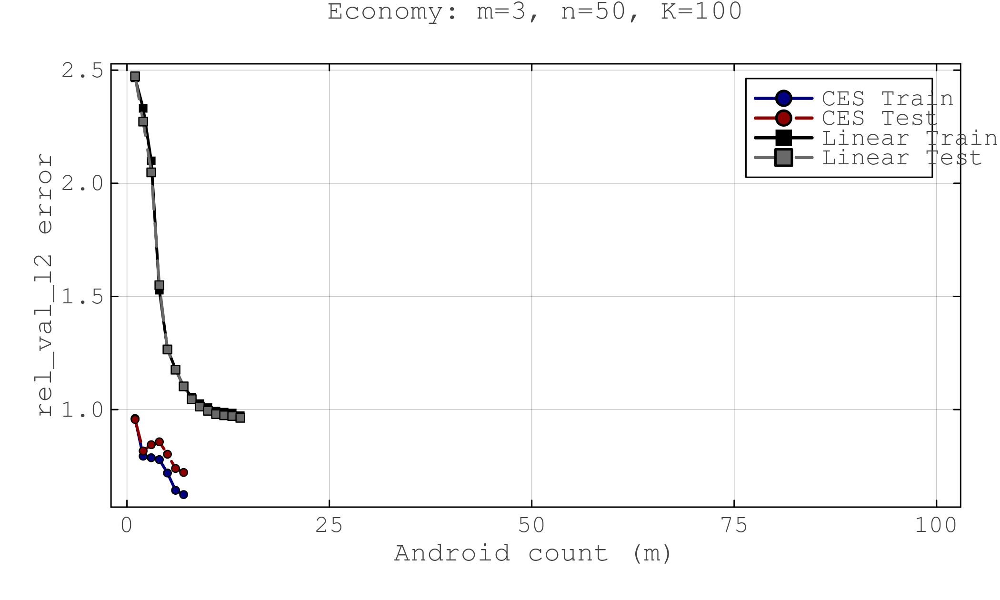

m=3, n=50, K=500
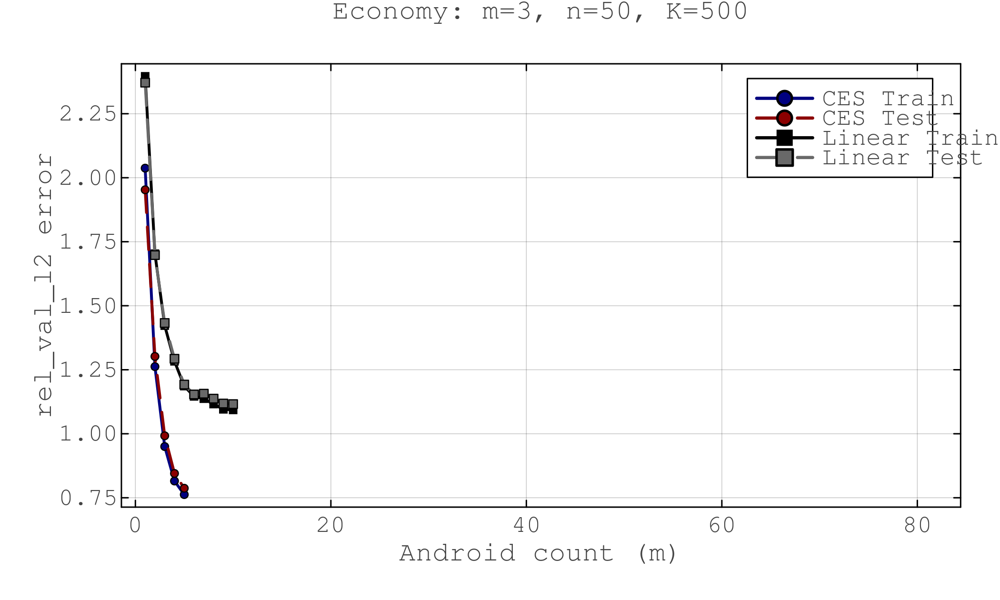

m=5, n=10, K=50
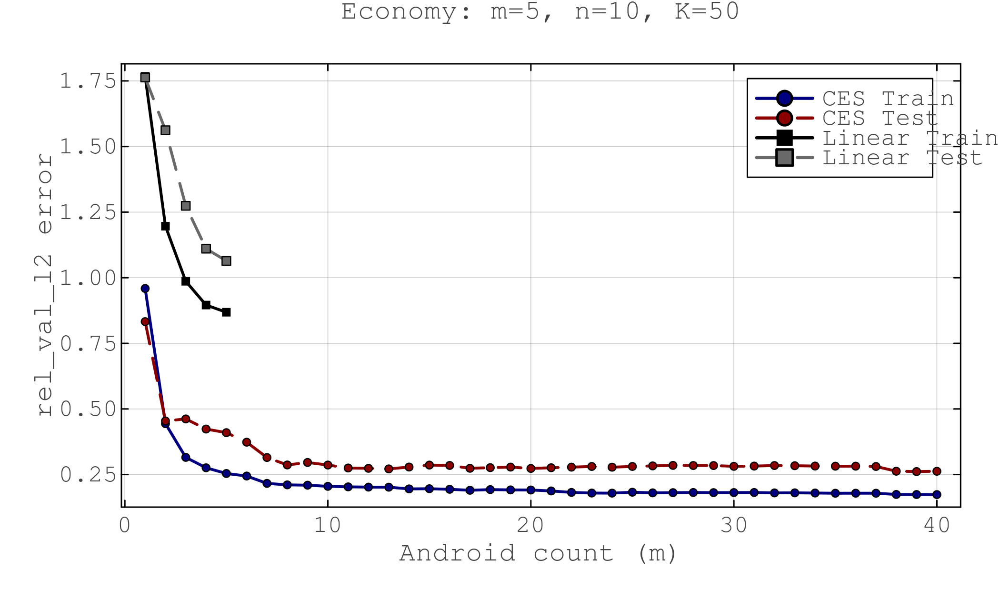

m=5, n=10, K=100
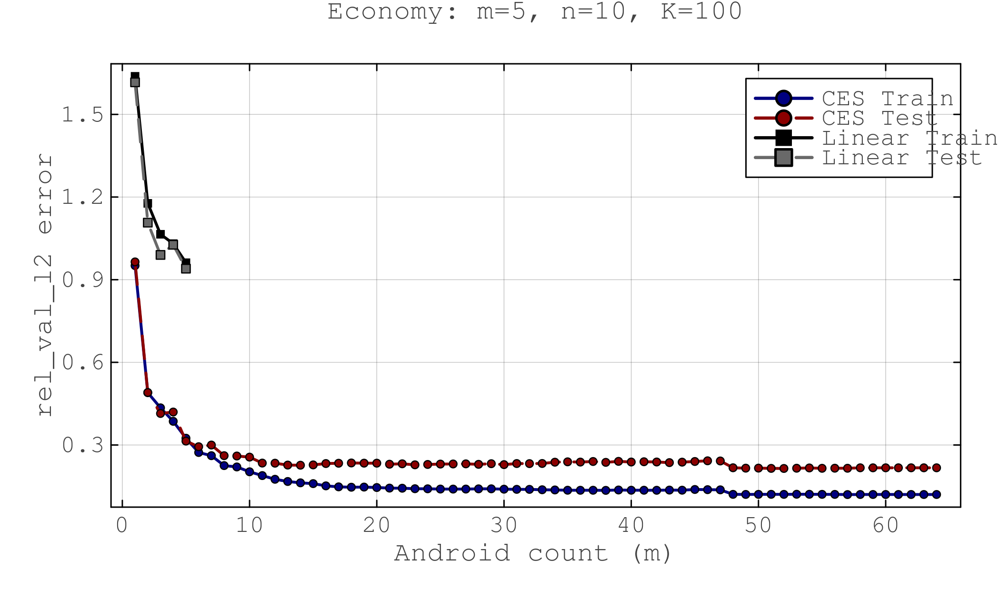

m=5, n=10, K=500
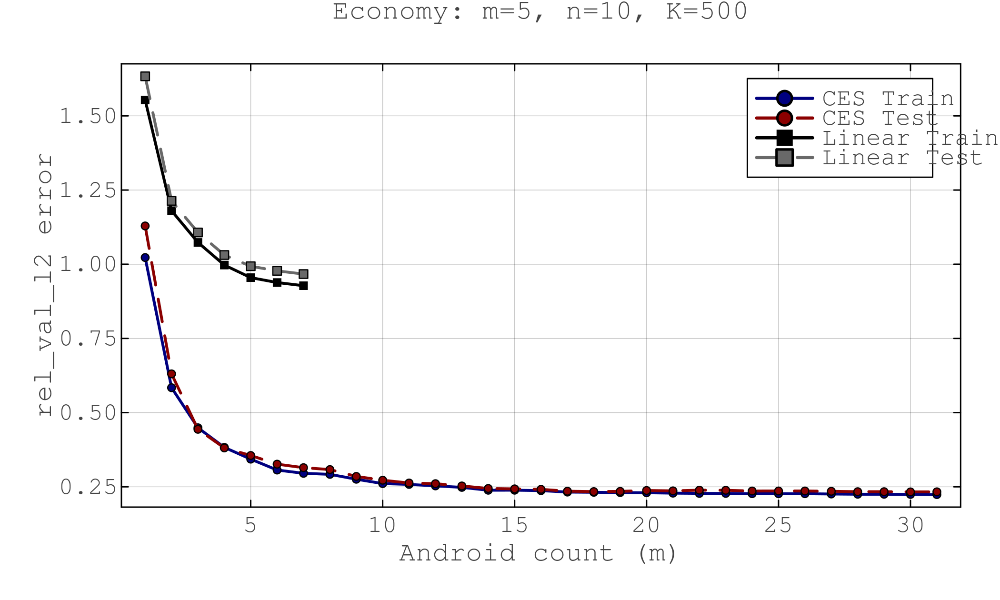

m=5, n=20, K=50
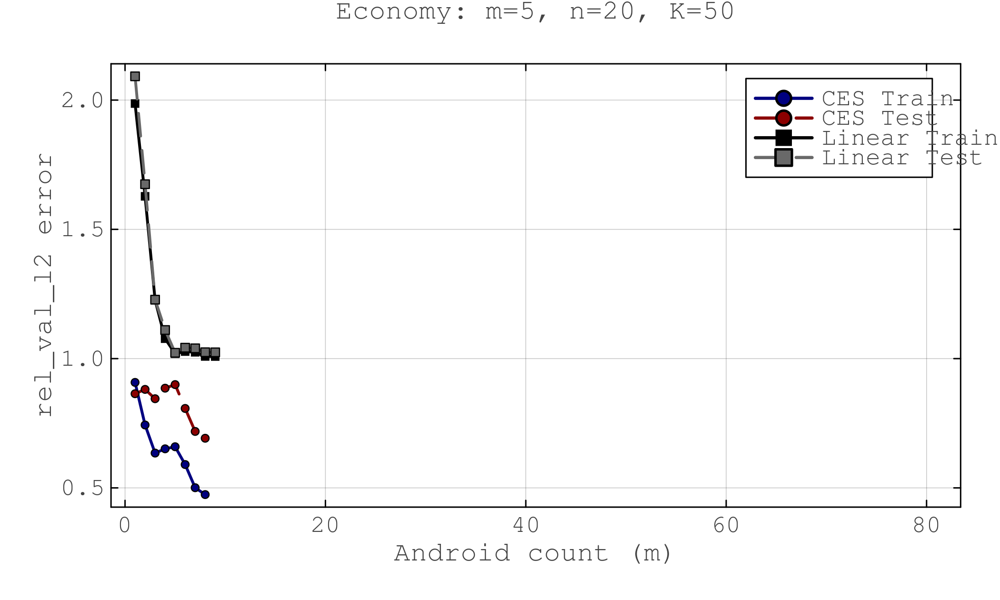

m=5, n=20, K=100
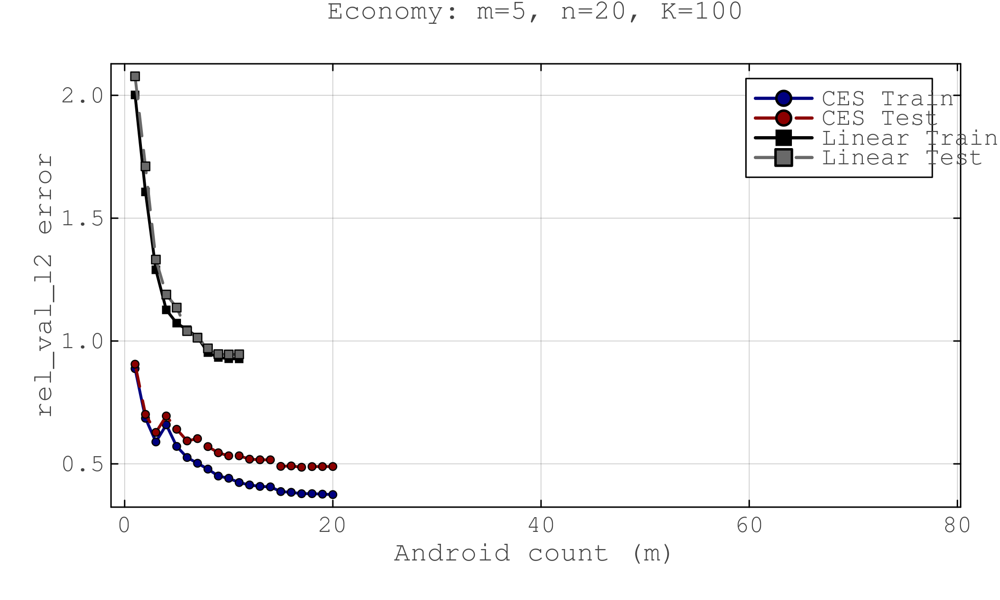

m=5, n=20, K=500
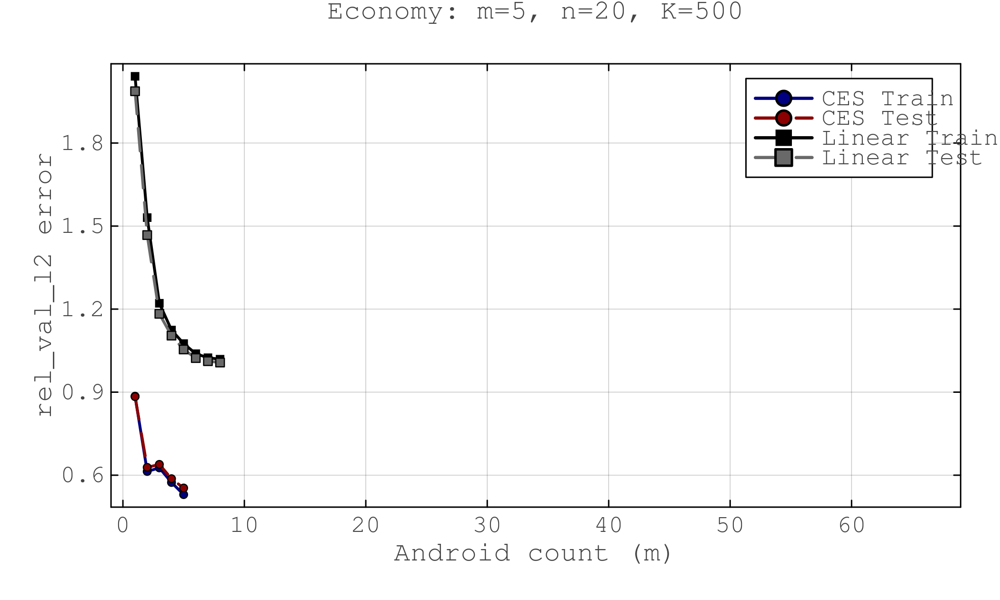

m=5, n=50, K=50
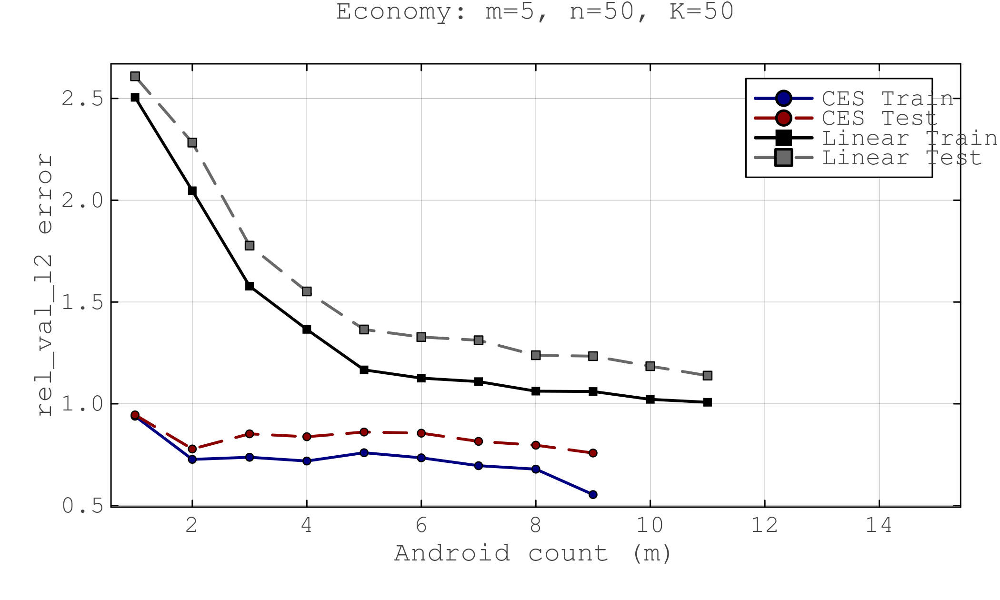

m=5, n=50, K=100
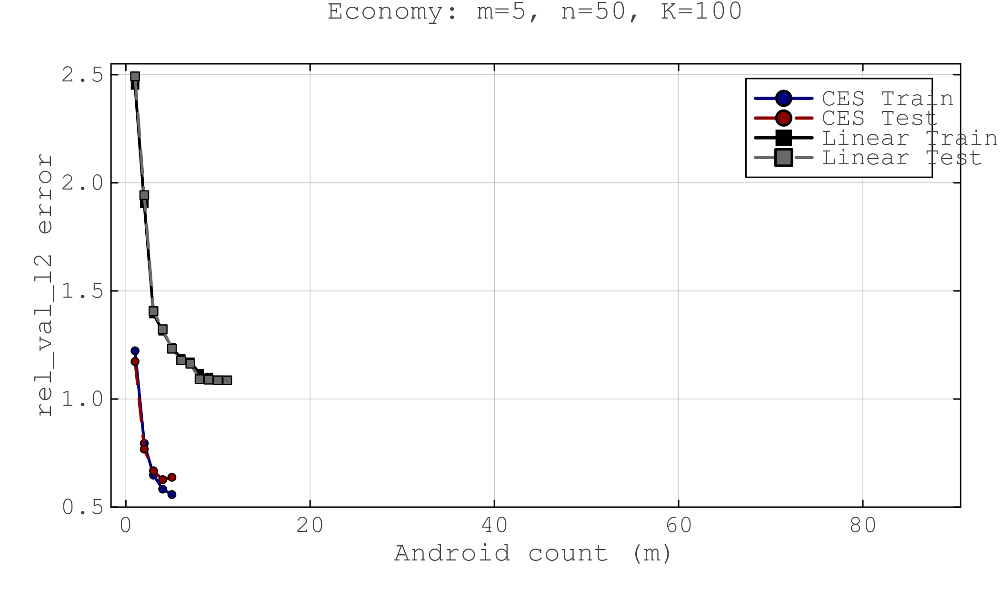

m=5, n=50, K=500
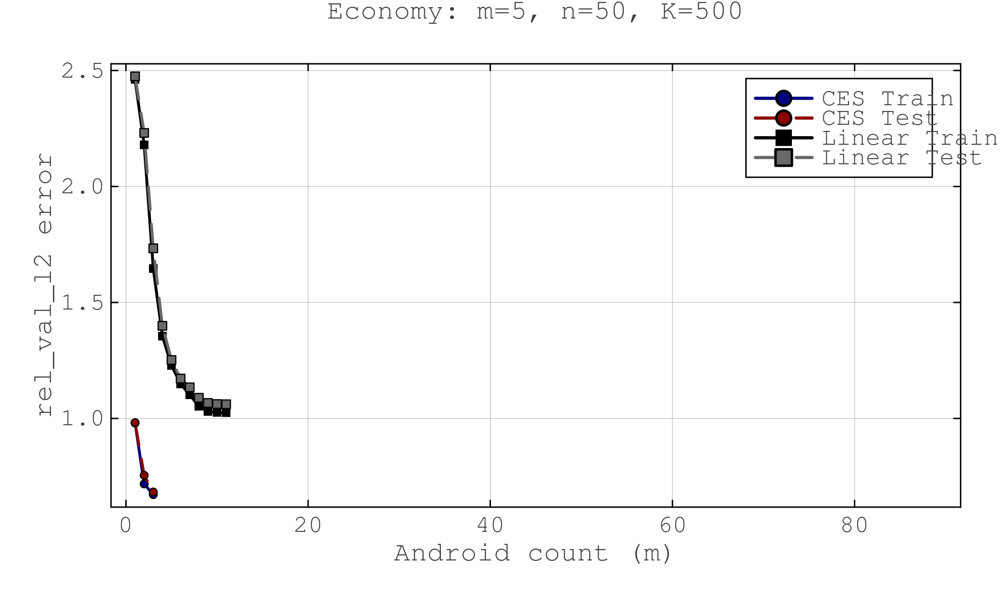

m=8, n=10, K=50
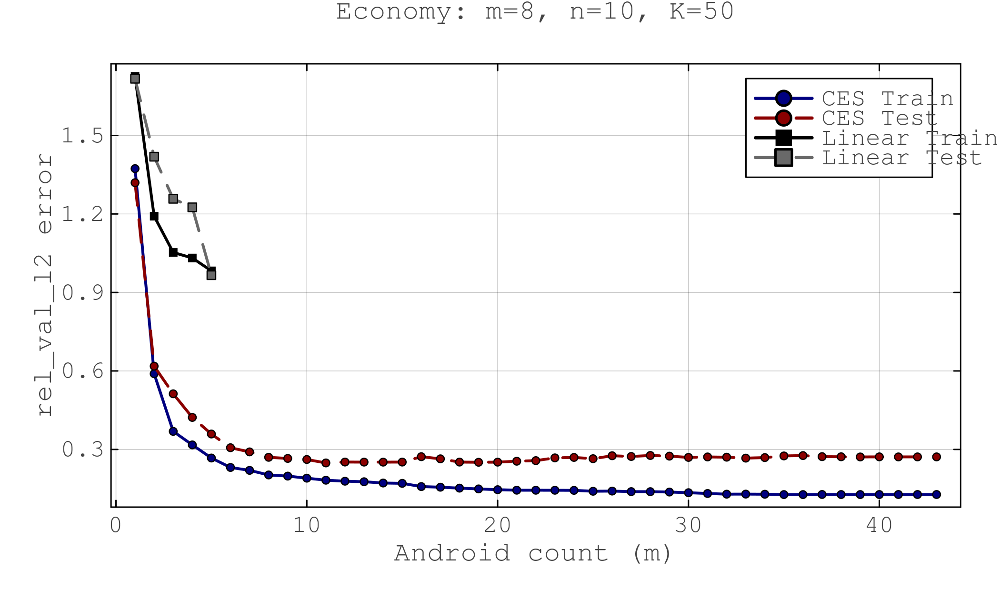

m=8, n=10, K=100
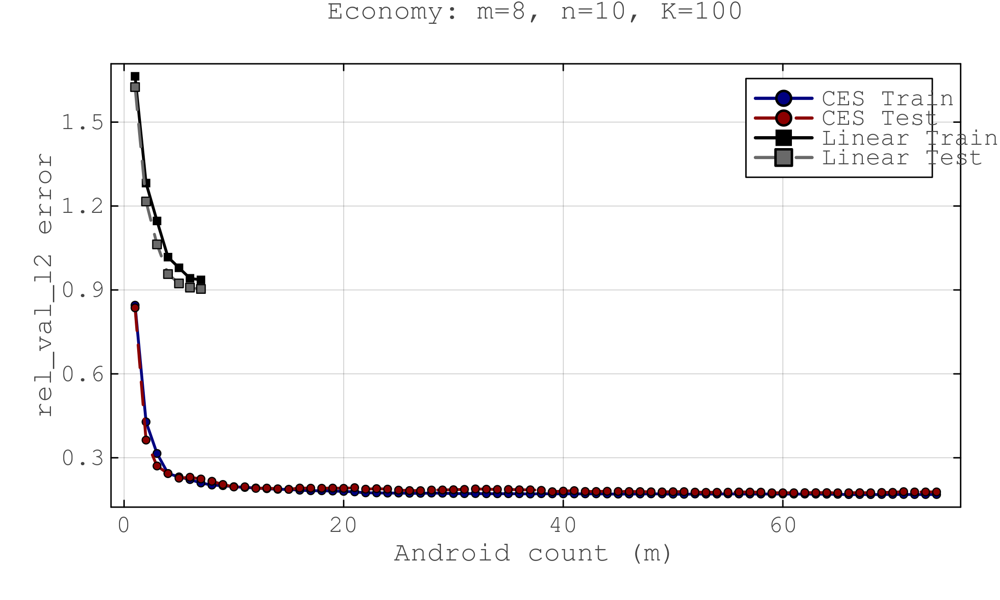

m=8, n=10, K=500
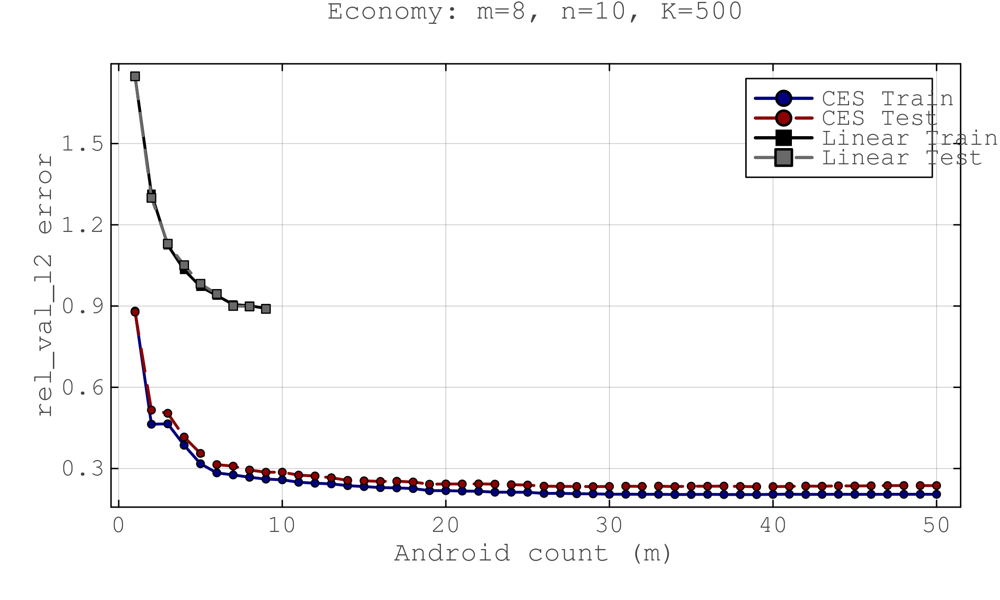

m=8, n=20, K=50
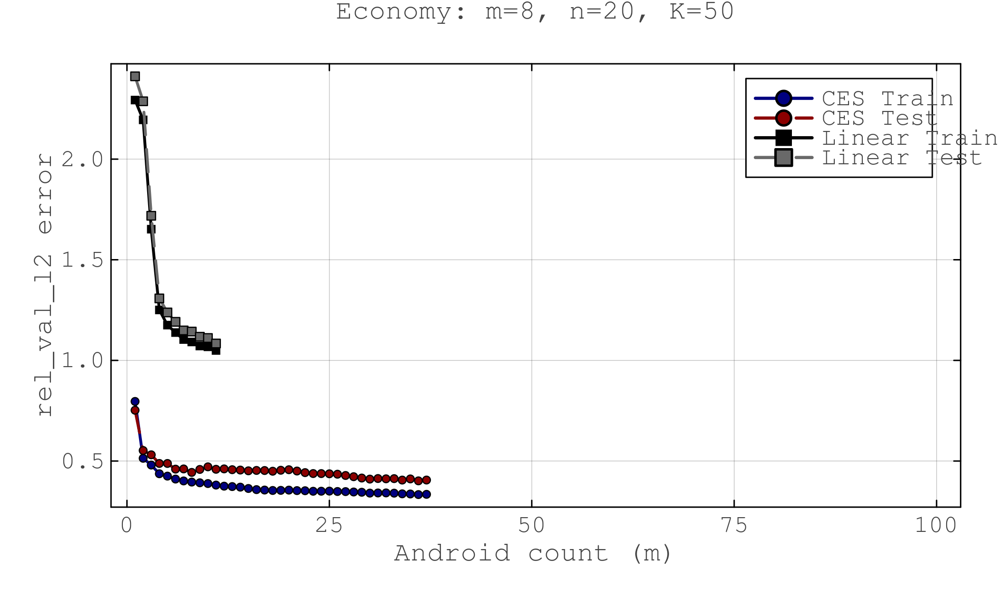

m=8, n=20, K=100
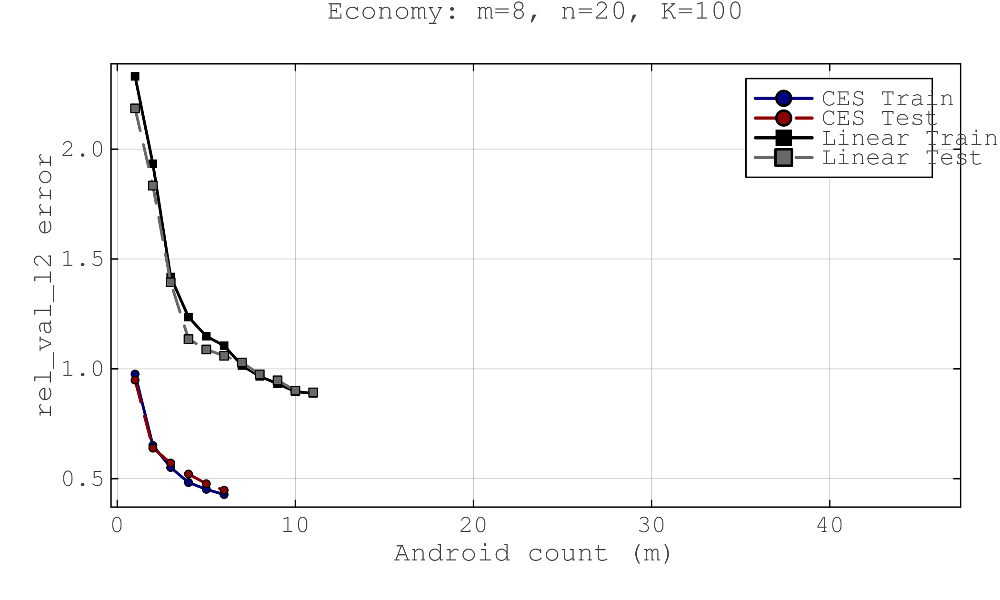

m=8, n=20, K=500
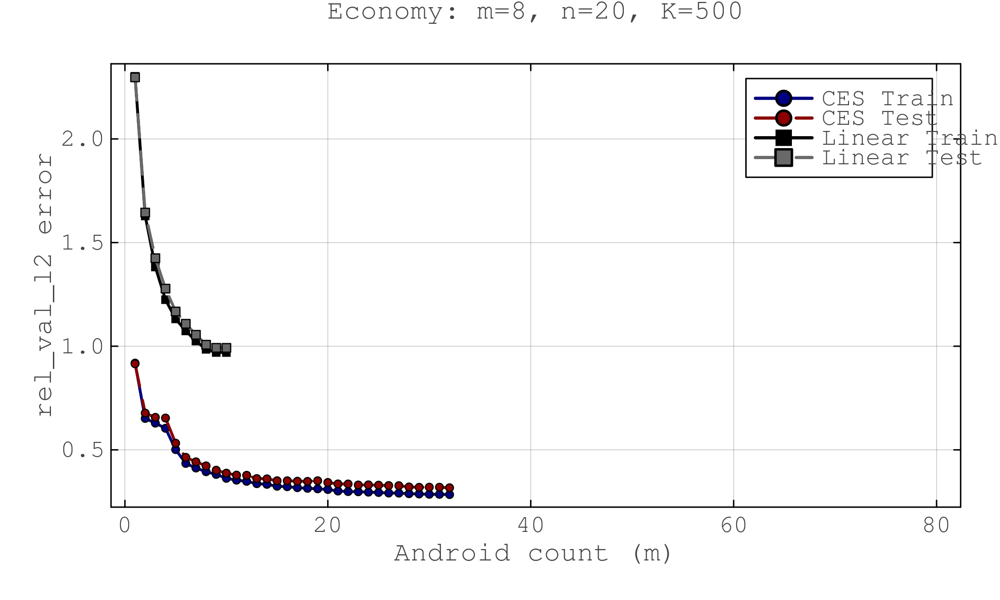

m=8, n=50, K=50
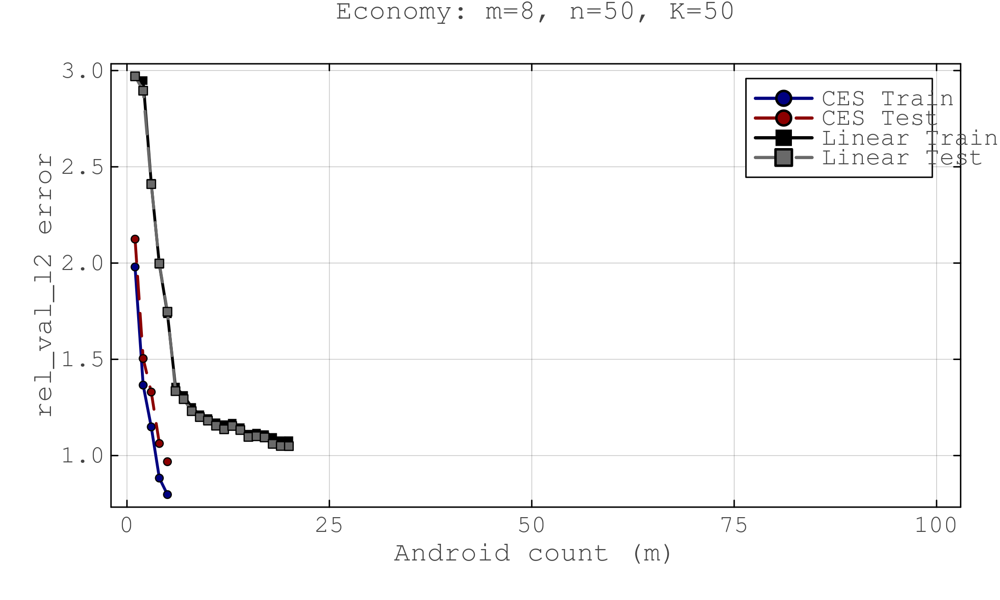

m=8, n=50, K=100
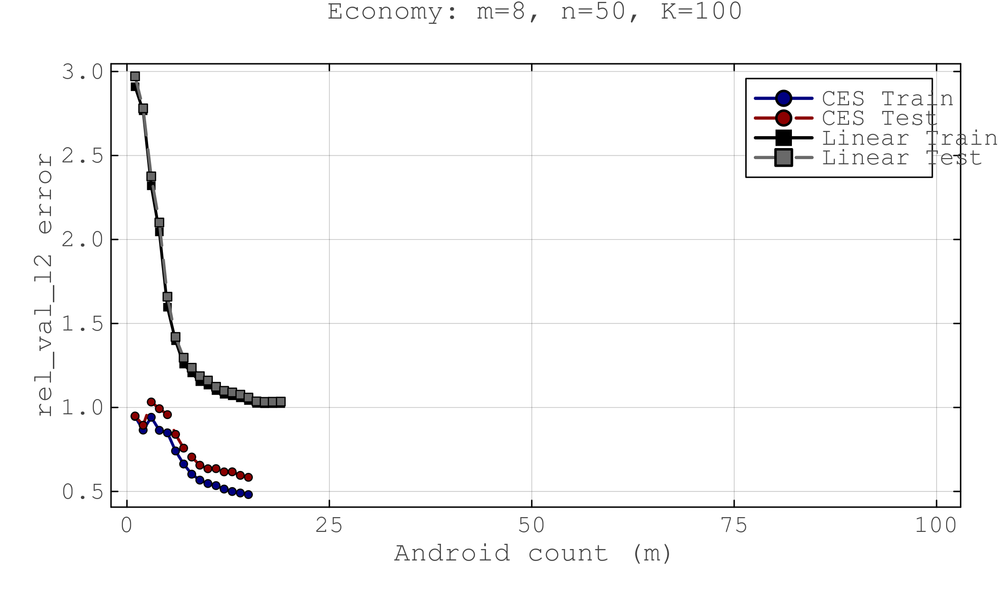

m=8, n=50, K=500
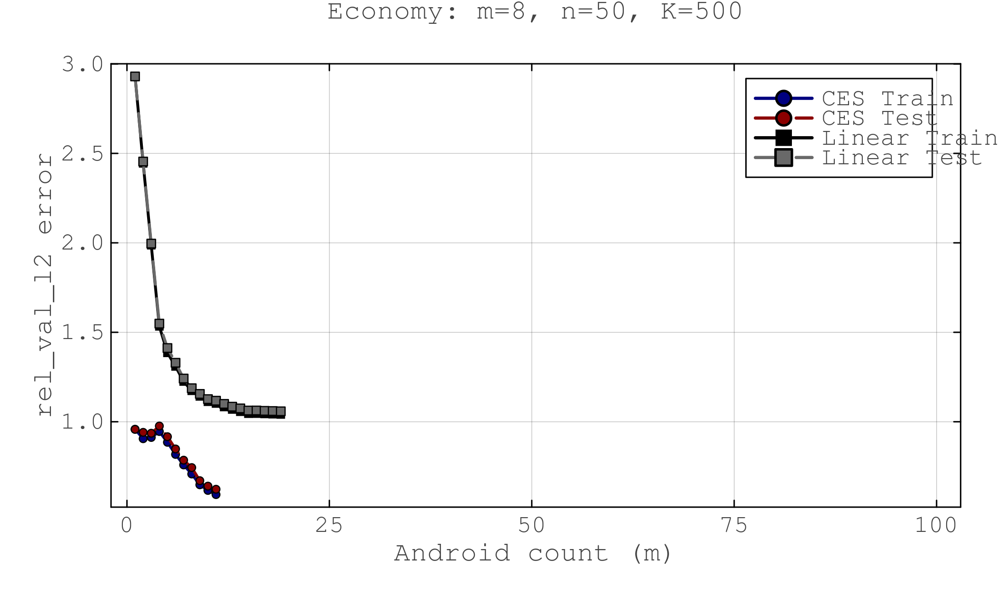

m=3, n=10, K=50
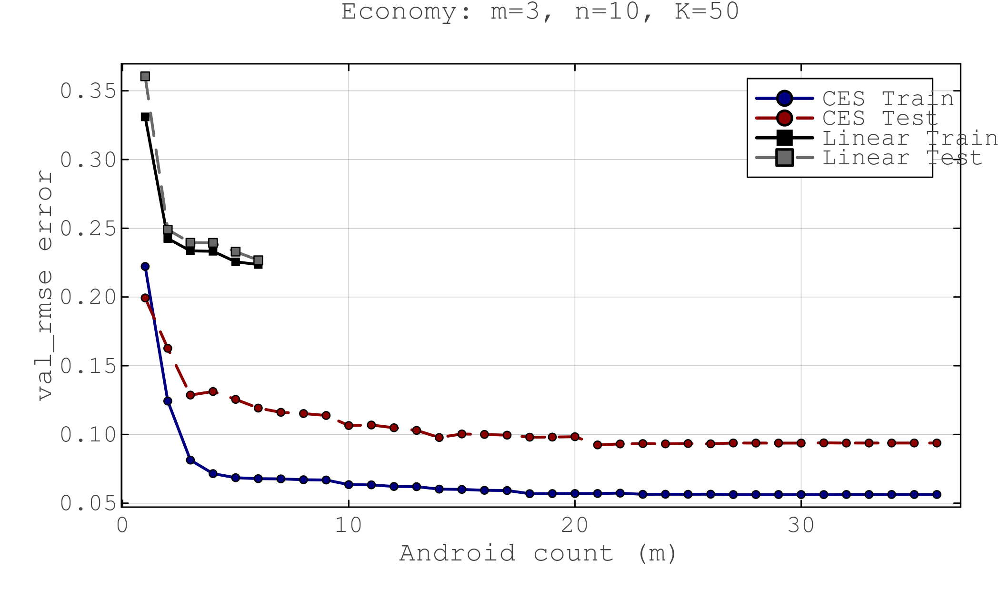

m=3, n=10, K=100
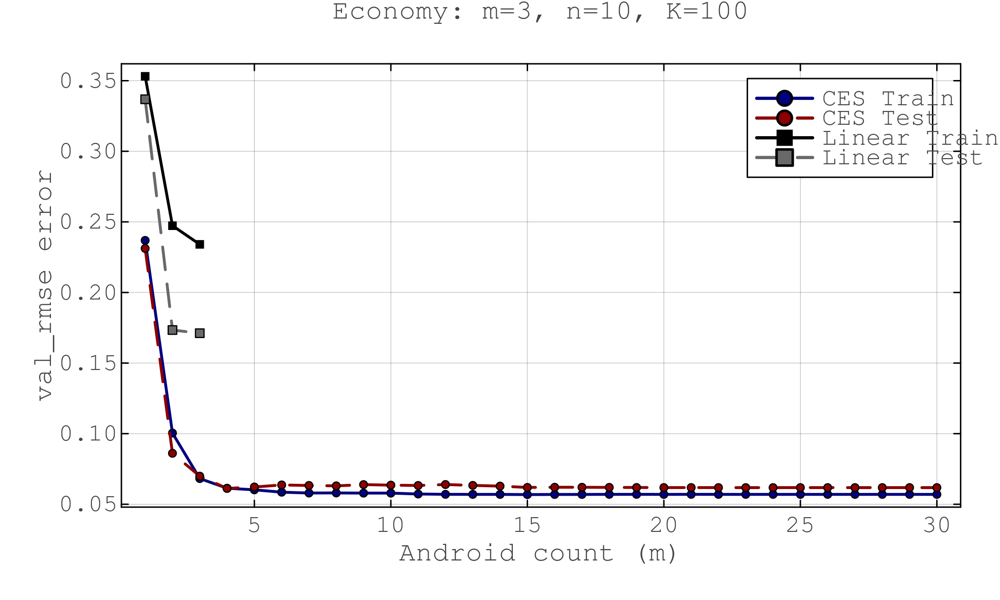

m=3, n=10, K=500
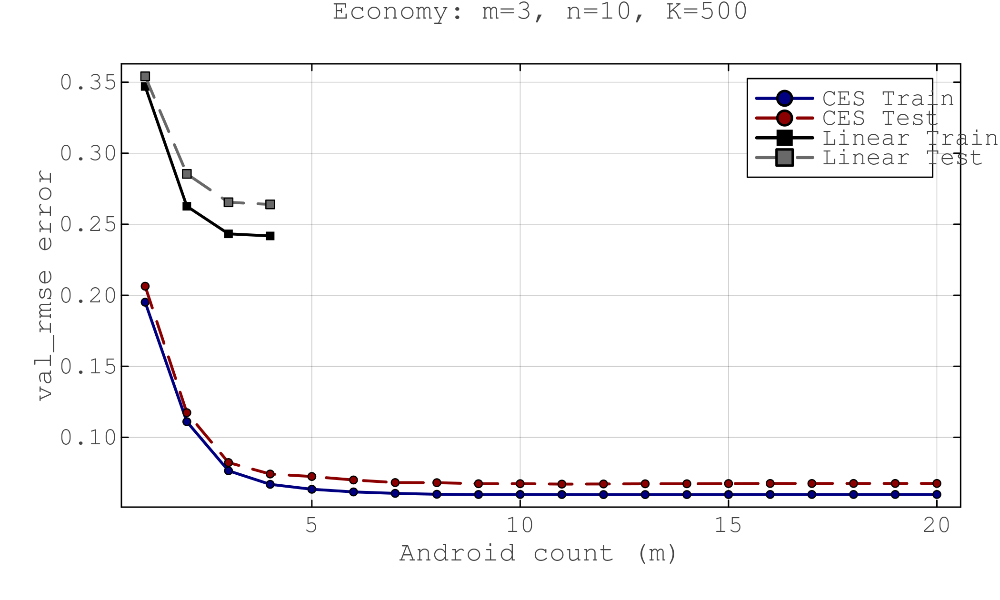

m=3, n=20, K=50
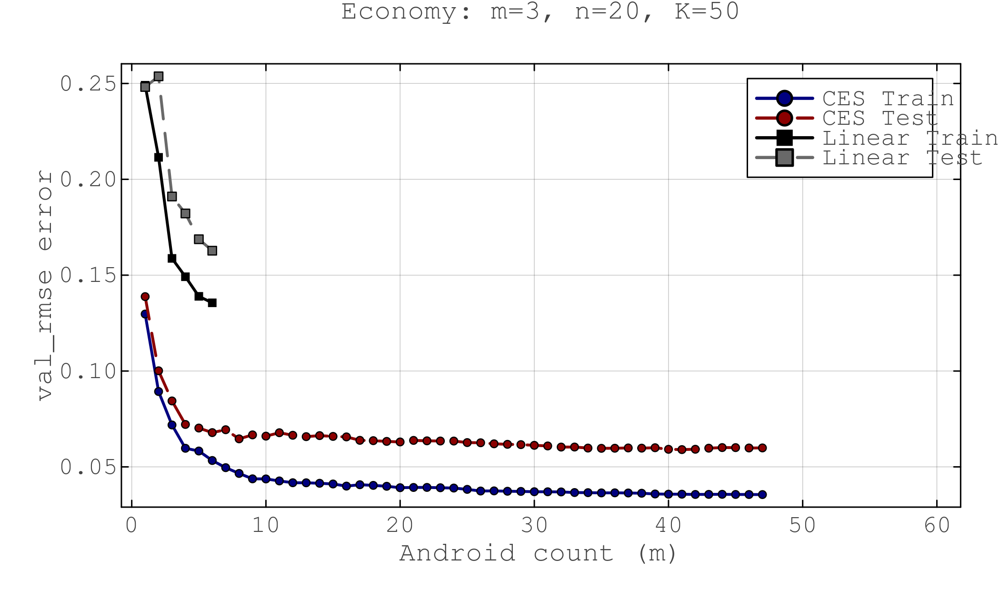

m=3, n=20, K=100
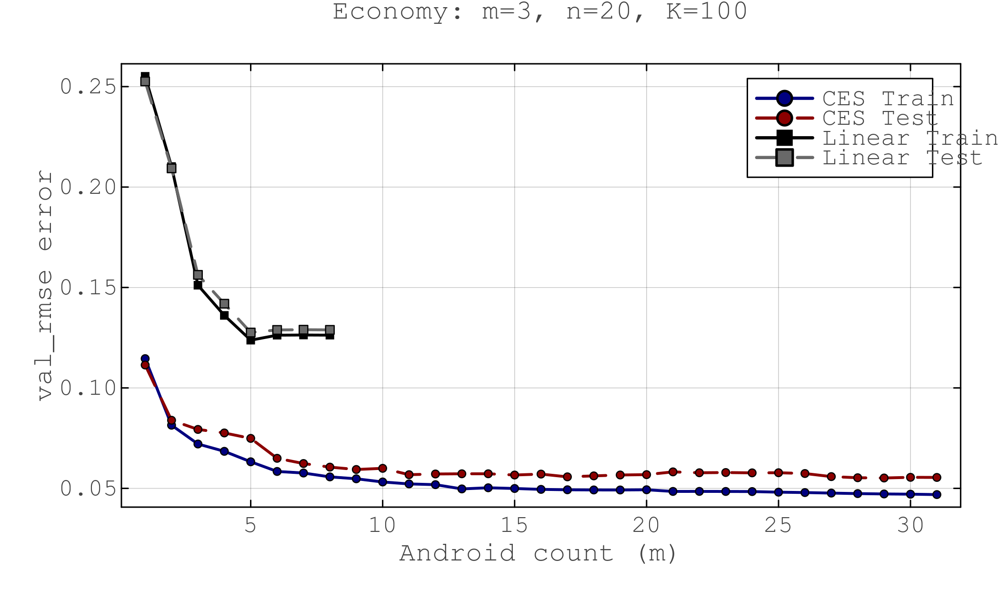

m=3, n=20, K=500
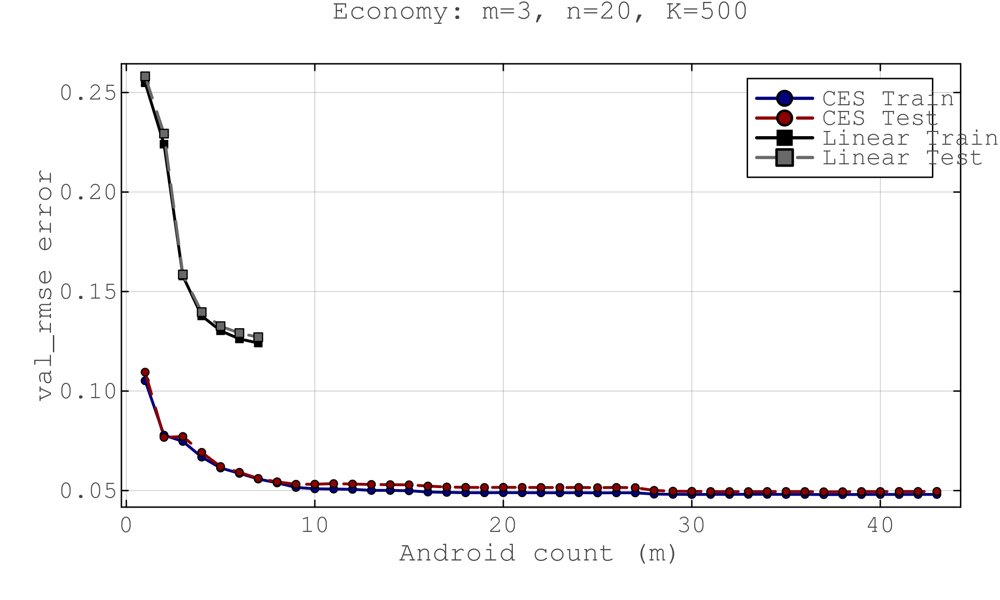

m=3, n=50, K=50
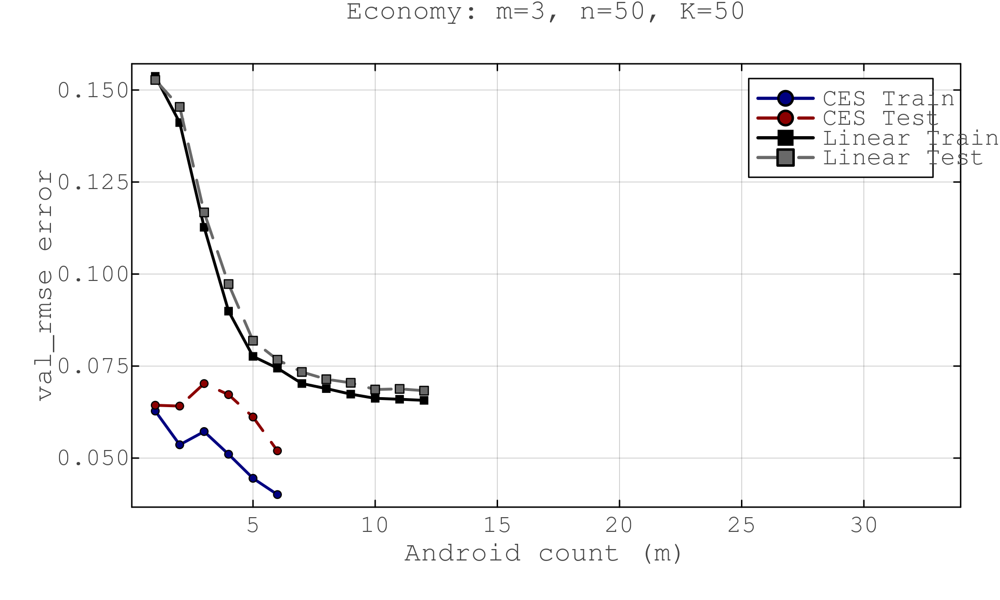

m=3, n=50, K=100
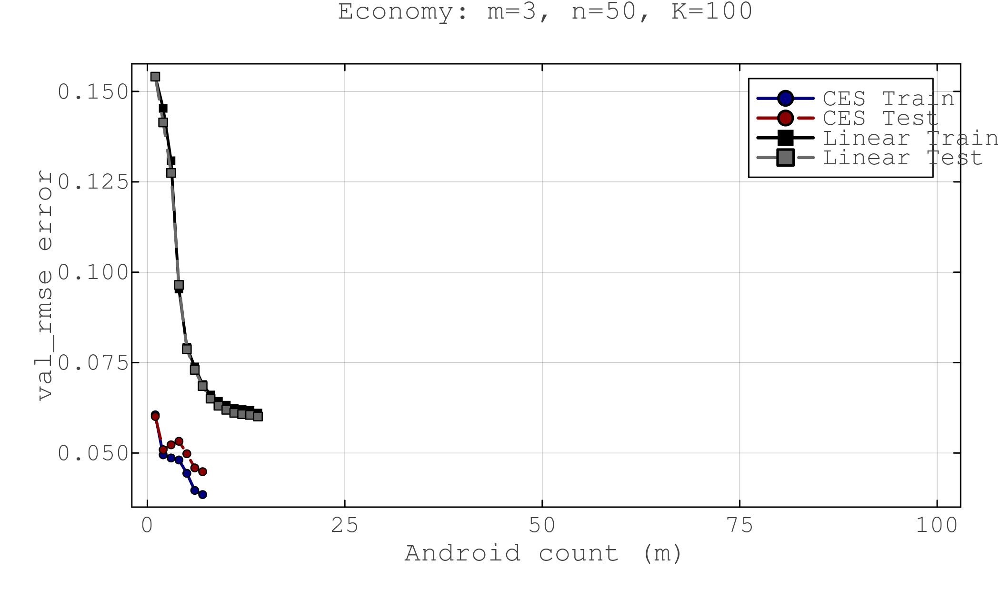

m=3, n=50, K=500
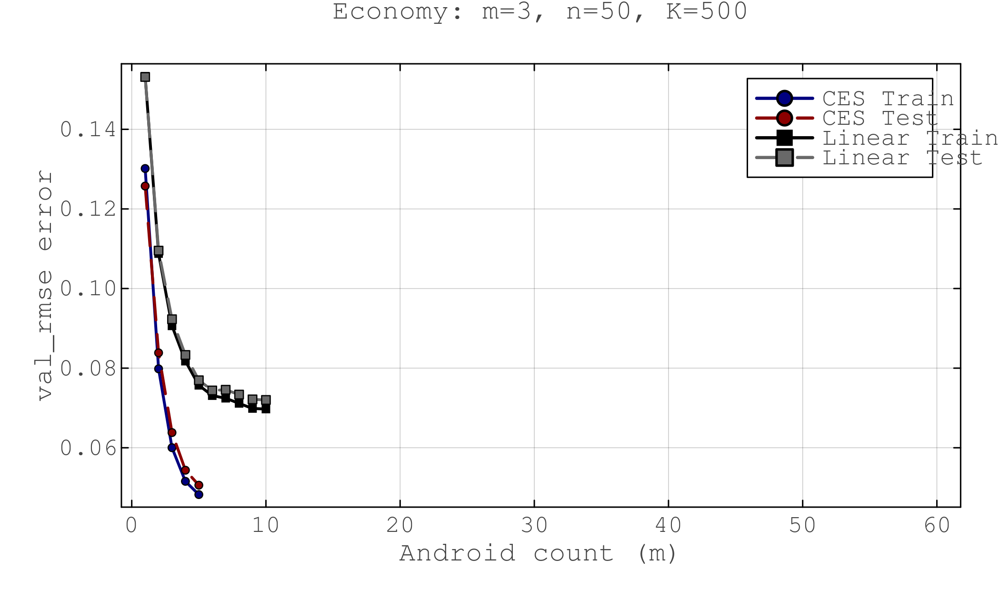

m=5, n=10, K=50
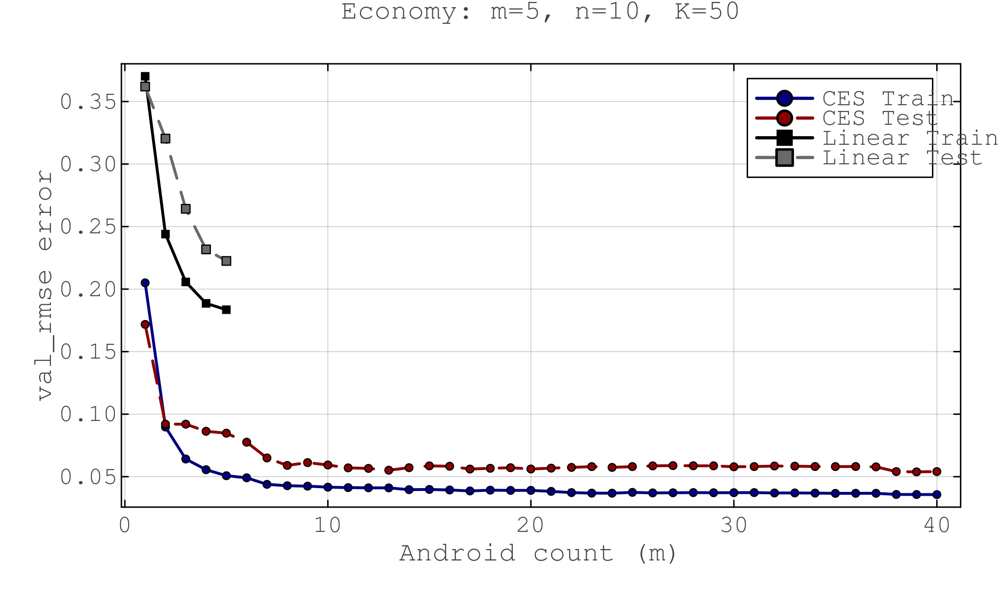

m=5, n=10, K=100
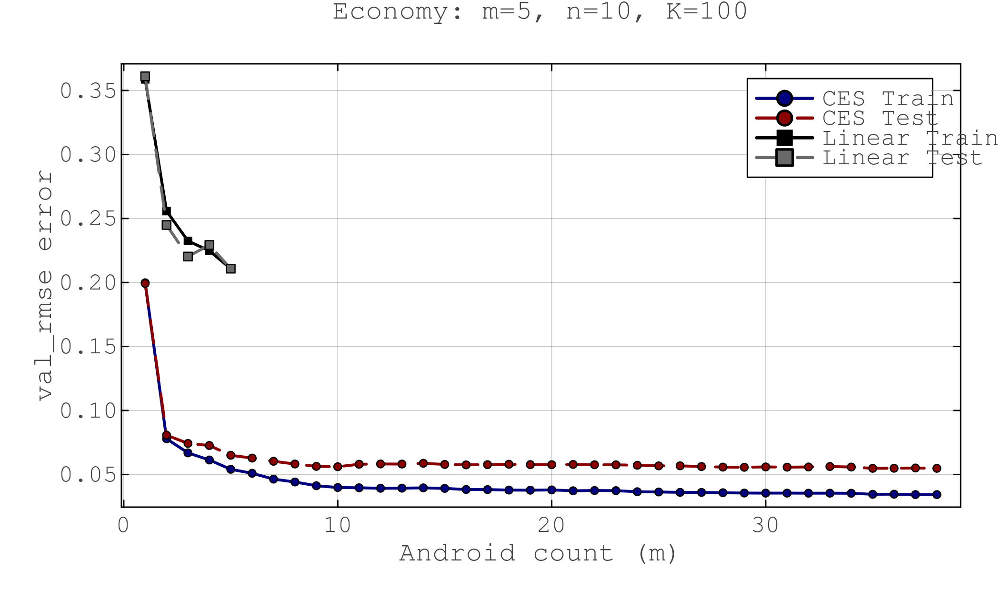

m=5, n=10, K=500
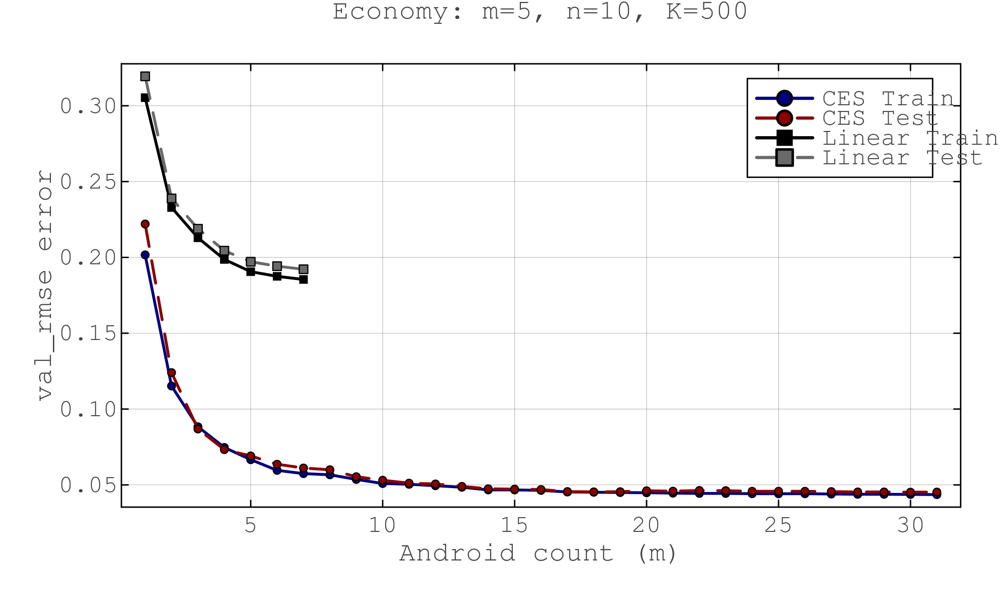

m=5, n=20, K=50
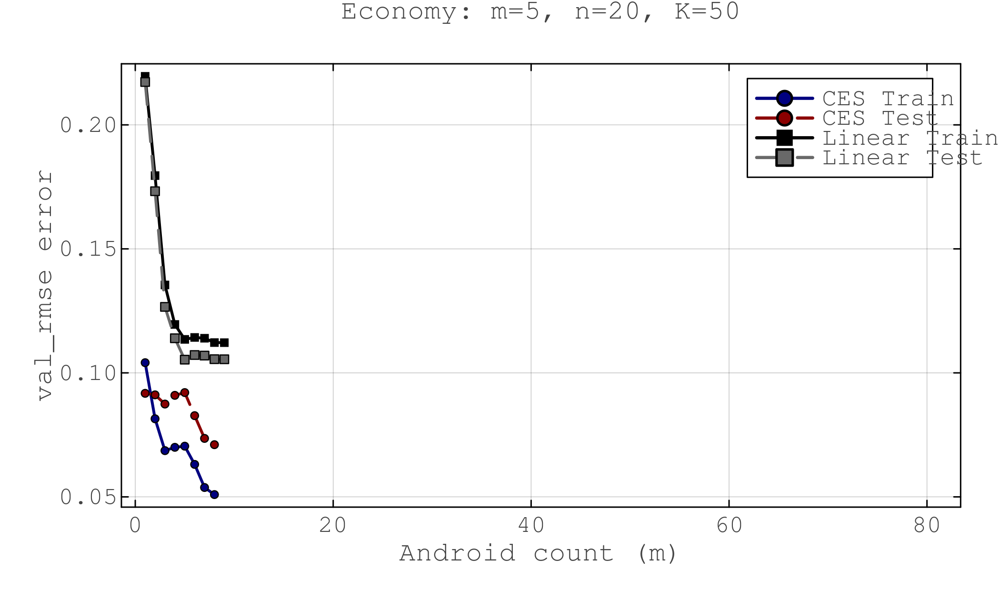

m=5, n=20, K=100
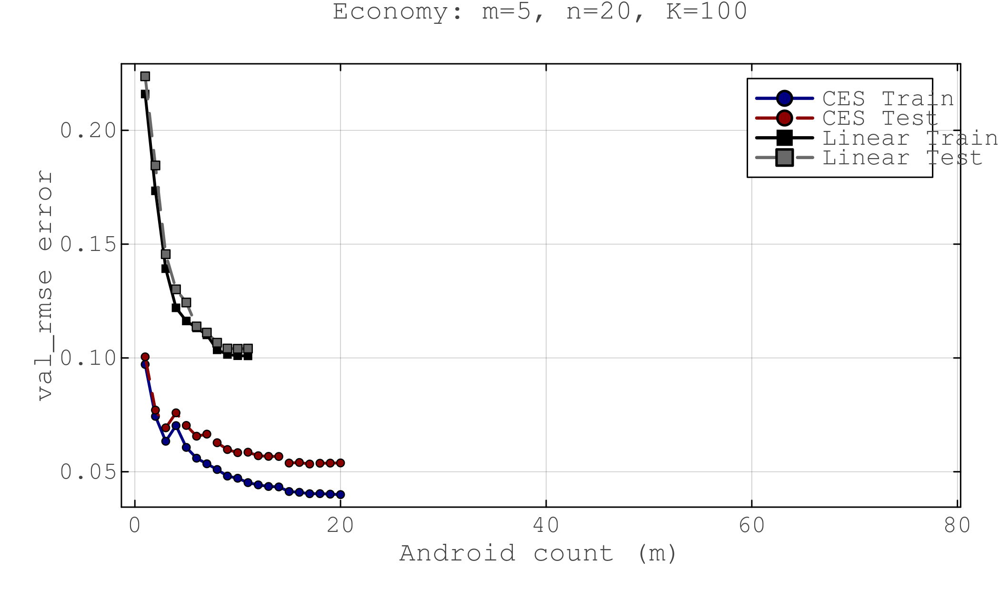

m=5, n=20, K=500
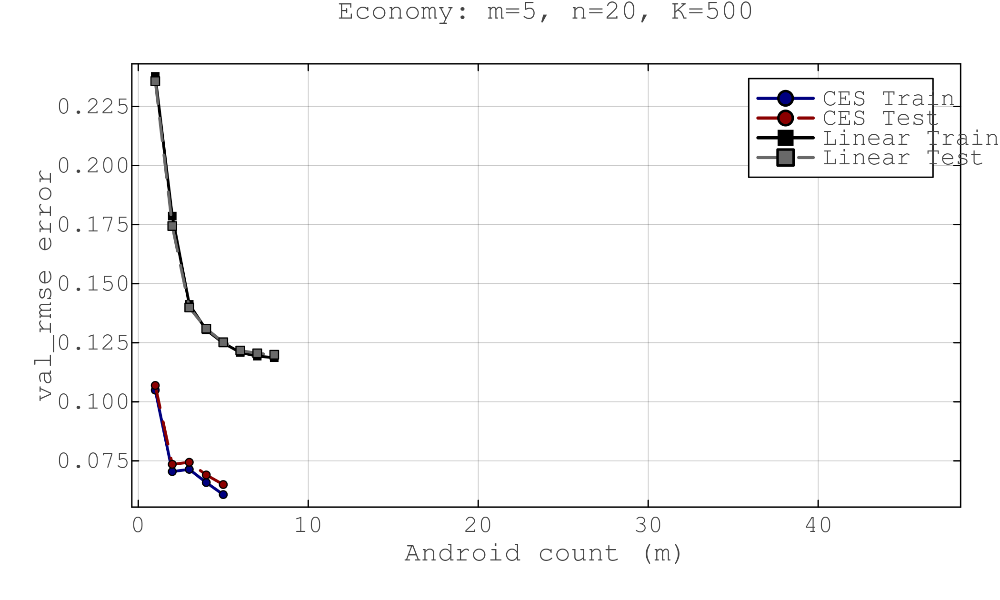

m=5, n=50, K=50
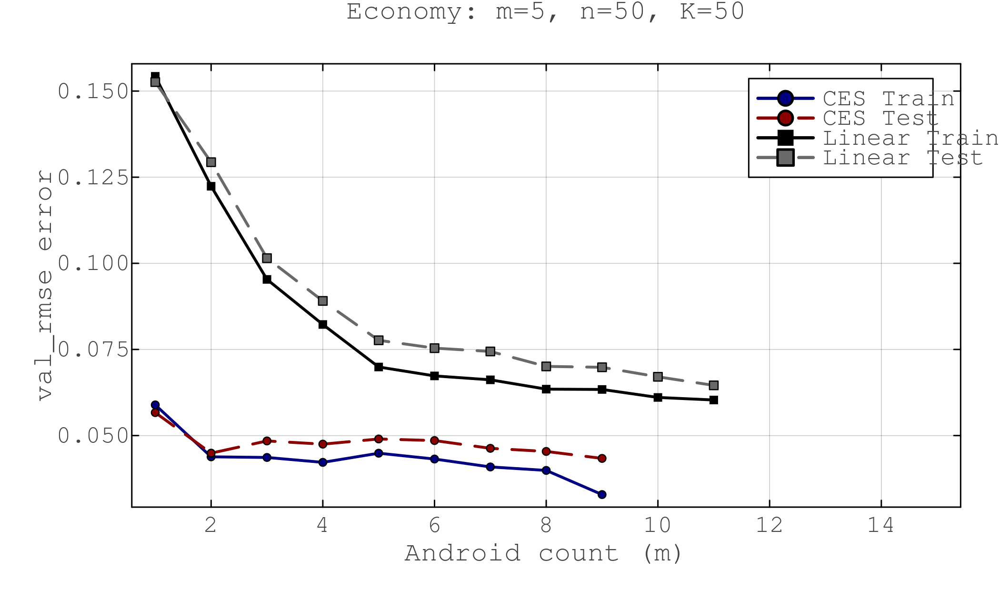

m=5, n=50, K=100
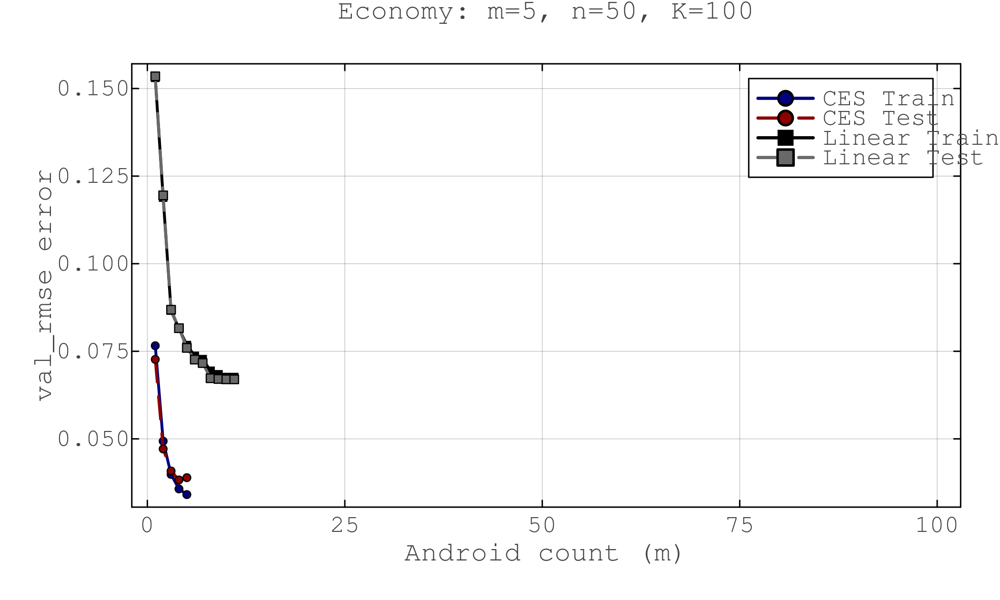

m=5, n=50, K=500
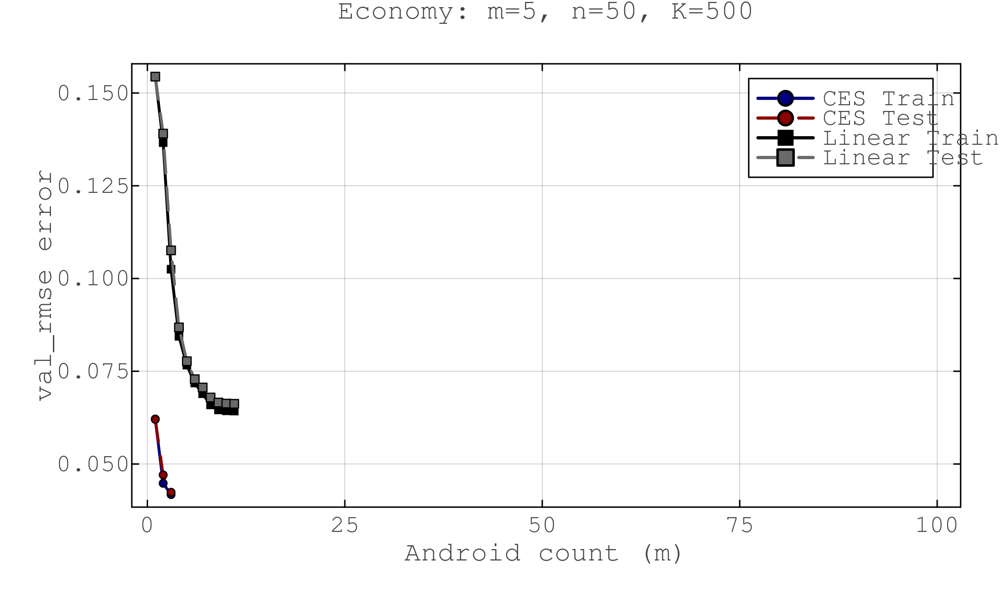

m=8, n=10, K=50
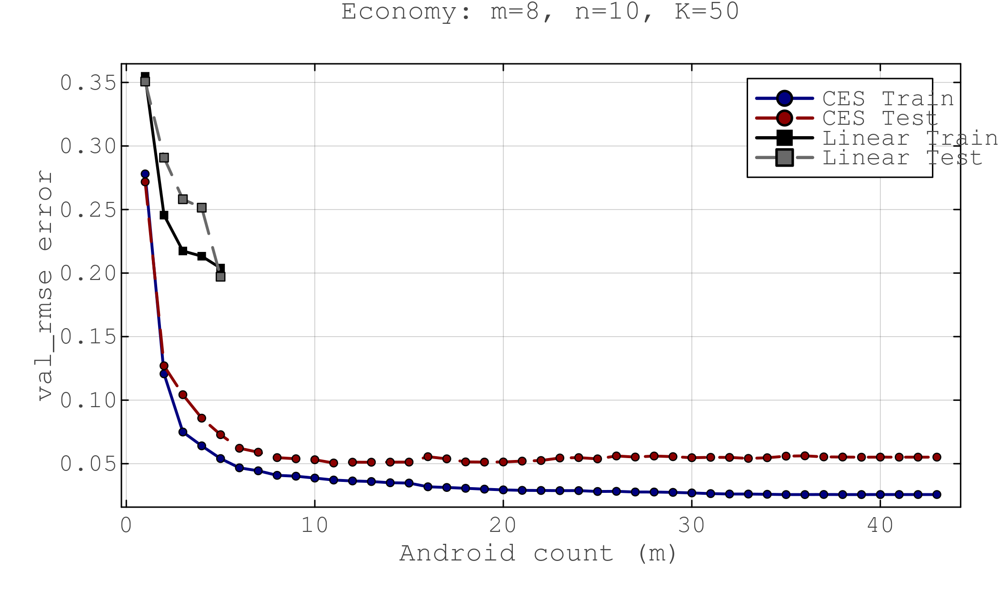

m=8, n=10, K=100
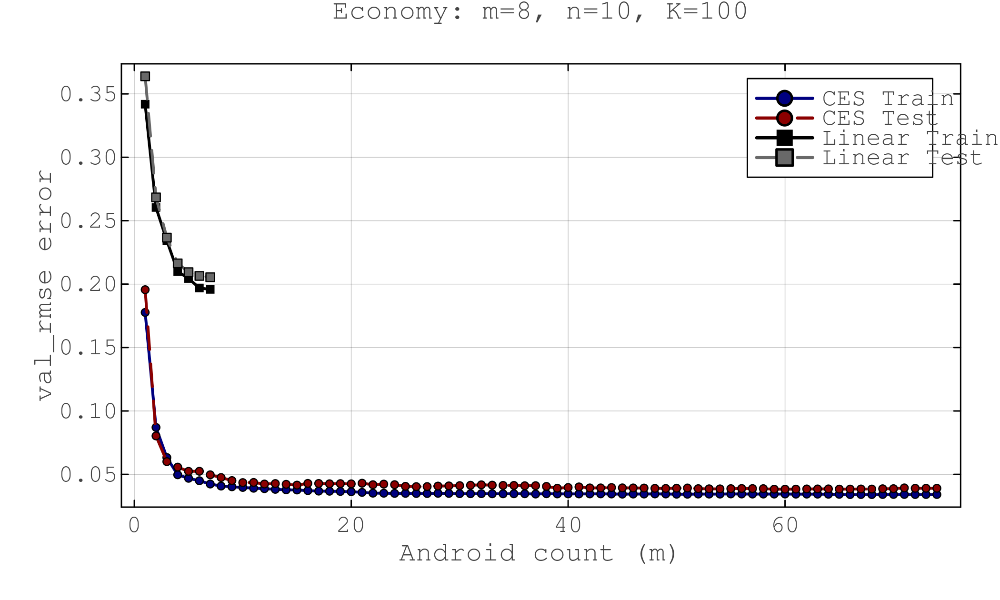

m=8, n=10, K=500
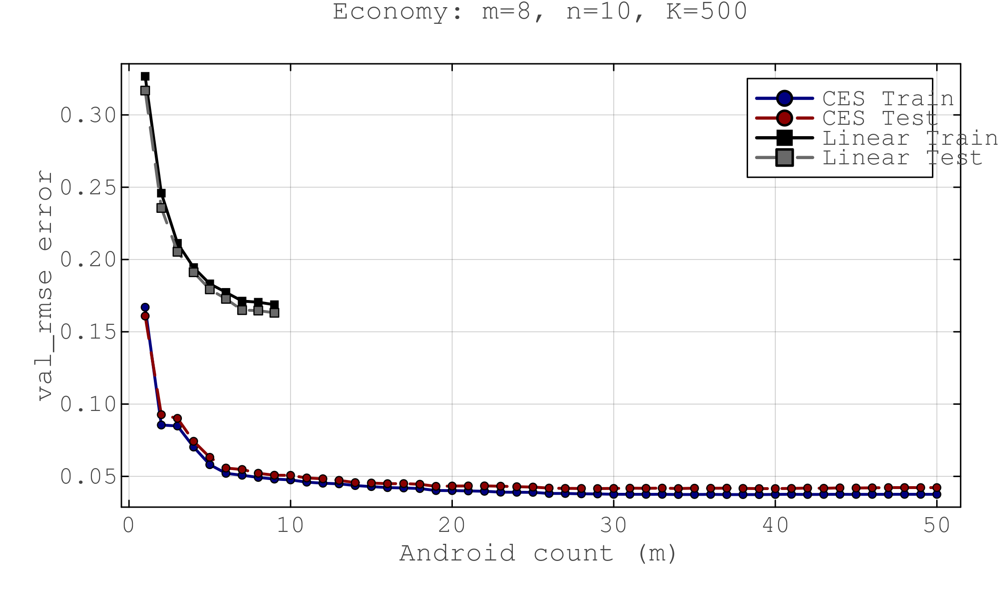

m=8, n=20, K=50
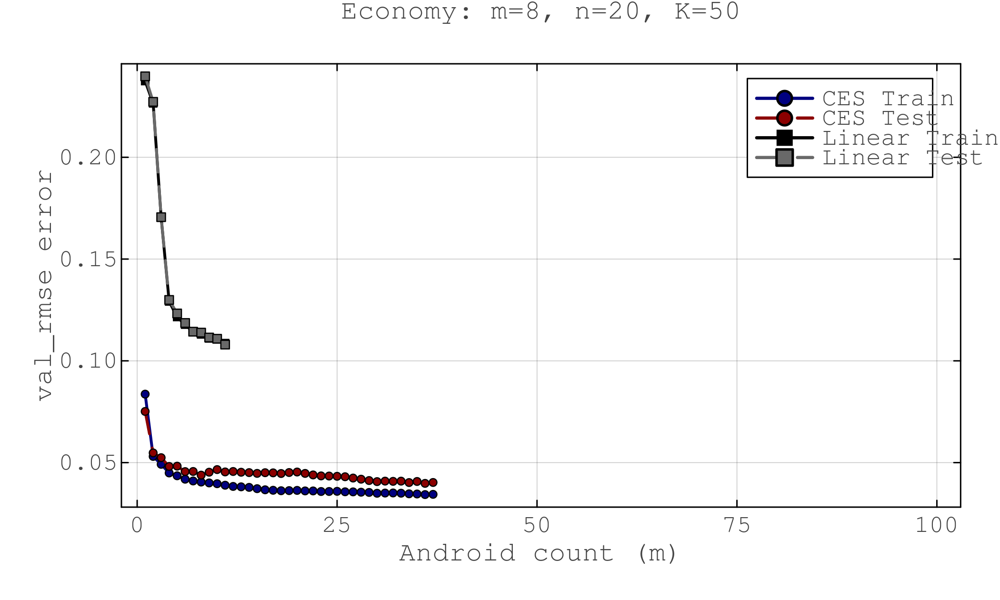

m=8, n=20, K=100
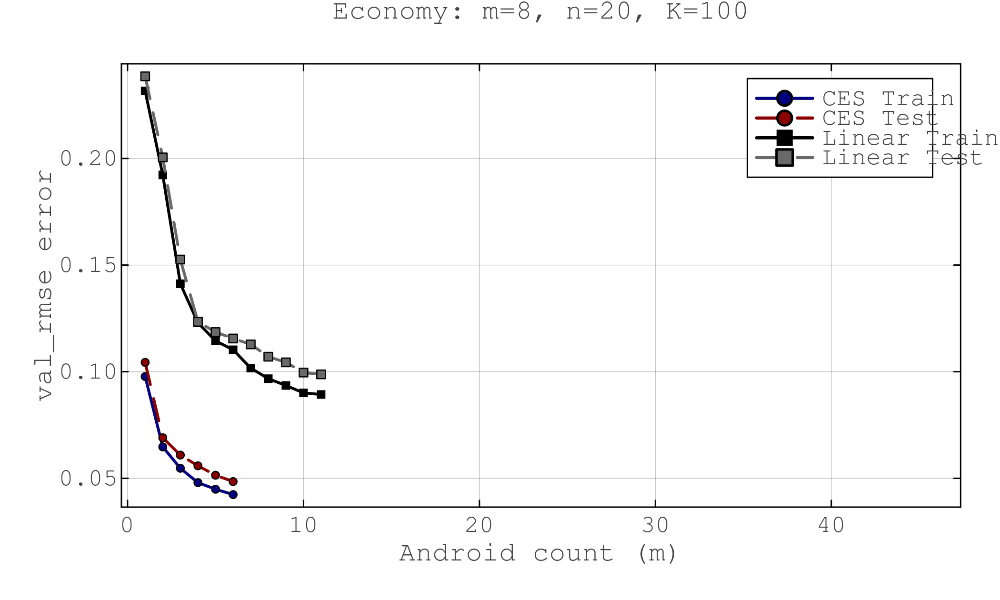

m=8, n=20, K=500
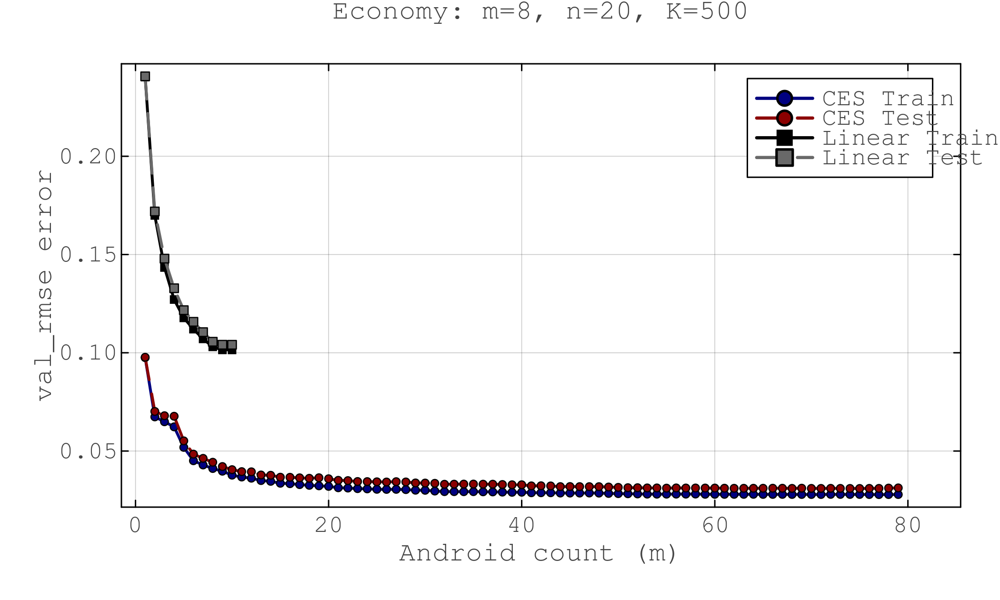

m=8, n=50, K=50
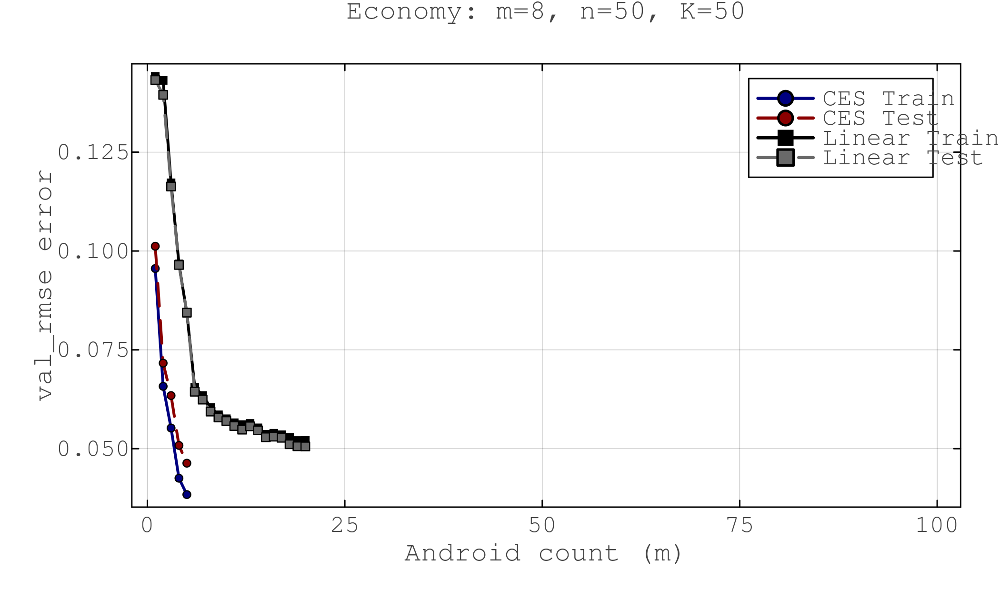

m=8, n=50, K=100
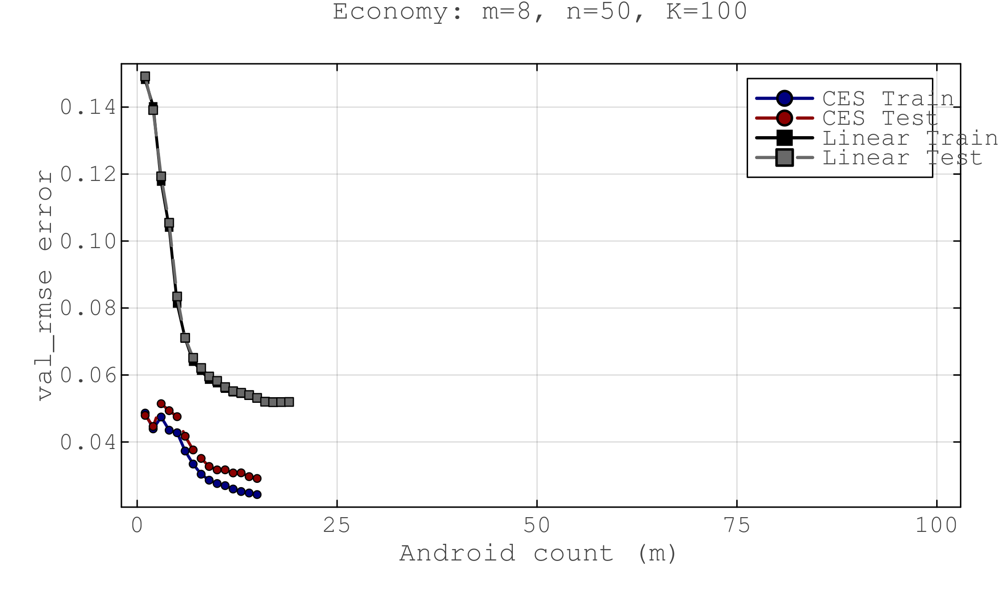

m=8, n=50, K=500
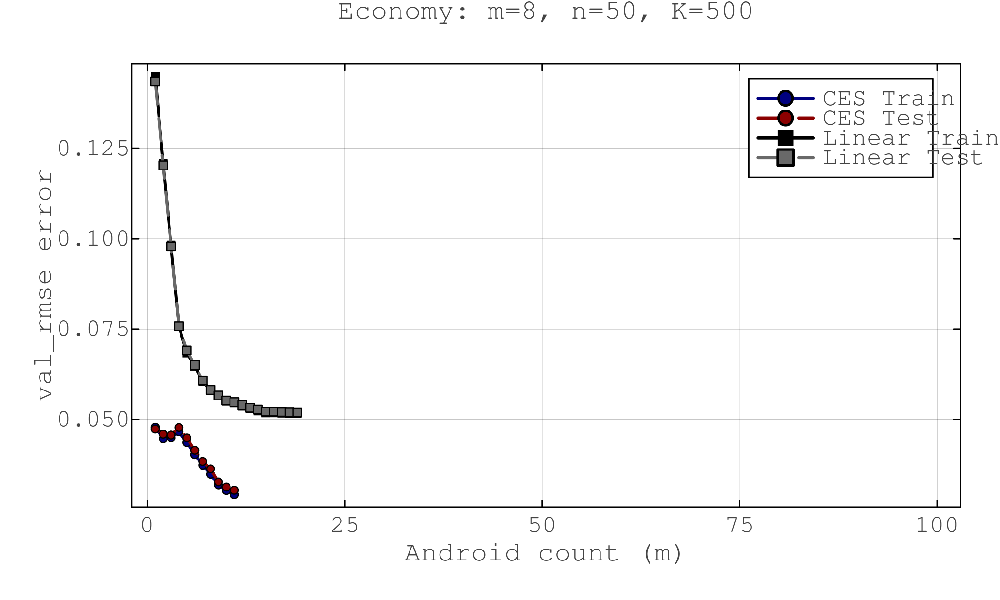

In [ ]:
using Glob
using Base64

img_dir = joinpath("..", "results", "exp_scale")
m_list = [3, 5, 8]
n_list = [10, 20, 50]
K_list = [50, 100, 500]
metrics = ["rel_val_l2", "val_rmse"]

for metric in metrics
    println("\n" * "="^80)
    println("Metric: $metric")
    println("="^80)

    pattern = "m*_n*_K*_$(metric).png"
    files = glob(pattern, img_dir)
    sort!(files) 
    
    if isempty(files)
        continue
    end
    
    for m in m_list
        for n in n_list
            for K in K_list
                fname = "m$(m)_n$(n)_K$(K)_$(metric).png"
                img_path = joinpath(img_dir, fname)
                
                if isfile(img_path)
                    println("配置: m=$m, n=$n, K=$K")
                    img_data = read(img_path)
                    img_base64 = base64encode(img_data)
                    display("text/html", """<div><p><strong>m=$m, n=$n, K=$K</strong></p><img src="data:image/png;base64,$img_base64" style="max-width:900px; border:1px solid #ddd;"></div>""")
                    println()
                end
            end
        end
    end
end